# Data Preprocessing and feature selection 

Step 1: Merging the dataframes and then creating two separate files for abundances and metadata in a desirable format

In [ ]:
import pandas as pd

# Paths
abundance_path = r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\Table_S1_Abundance.xlsx"
metadata_path = r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\Table_S2_Metadata.xlsx"

# Read abundance file, skip first row
abundance_df = pd.read_excel(abundance_path, header=1)

# Print columns to check actual name
print("Abundance columns:", abundance_df.columns.tolist())

# Use the actual column name for taxonomic path
tax_col = abundance_df.columns[0]  # Usually the first column

# Transpose so samples are rows, taxa are columns
abundance_t = abundance_df.set_index(tax_col).transpose()
abundance_t.index.name = 'Subject ID'
abundance_t.reset_index(inplace=True)

# Read metadata
metadata_df = pd.read_excel(metadata_path)

# Merge on Subject ID
merged_df = pd.merge(metadata_df, abundance_t, left_on='Subject ID', right_on='Subject ID', how='inner')

# Save to Excel
merged_df.to_excel("merged_ml_ready.xlsx", index=False)
print("Merged file saved as merged_ml_ready.xlsx")

In [12]:
import pandas as pd

# Assume the previous code has been run and merged_df is available

# Paths
abundance_path = r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\Table_S1_Abundance.xlsx"
metadata_path = r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\Table_S2_Metadata.xlsx"

# Read abundance file, skip first row
abundance_df = pd.read_excel(abundance_path, header=1)
tax_col = abundance_df.columns[0]
abundance_t = abundance_df.set_index(tax_col).transpose()
abundance_t.index.name = 'Subject ID'
abundance_t.reset_index(inplace=True)

# Read metadata
metadata_df = pd.read_excel(metadata_path)

# Merge on Subject ID
merged_df = pd.merge(metadata_df, abundance_t, left_on='Subject ID', right_on='Subject ID', how='inner')

# Identify and separate the columns
# The metadata columns are the original columns of metadata_df
metadata_cols = metadata_df.columns.tolist()

# The abundance columns are all columns in merged_df that are NOT in metadata_df
# This is a good way to handle dynamic data
abundance_cols = [col for col in merged_df.columns if col not in metadata_cols]

# Create the new dataframes
metadata_only_df = merged_df[metadata_cols]
abundance_only_df = merged_df[['Subject ID'] + abundance_cols]

# Clean up column names for data-scientist-friendliness
# Strip any leading/trailing whitespace
metadata_only_df.columns = metadata_only_df.columns.str.strip()
abundance_only_df.columns = abundance_only_df.columns.str.strip()

# Save the separated dataframes to new Excel files
metadata_only_df.to_excel("metadata_only.xlsx", index=False)
abundance_only_df.to_excel("abundance_only.xlsx", index=False)

print("Metadata saved to metadata_only.xlsx")
print("Abundance saved to abundance_only.xlsx")

Metadata saved to metadata_only.xlsx
Abundance saved to abundance_only.xlsx


# Exploratory Analyses

#PCA

MICROBIOME DATA ANALYSIS: CLR + PCA
Original data shape: (1004, 993)
Data type: Relative abundances (assumed)
Row sums range: [1.000000, 1.000000]
Prevalence filter (5.0%): 224/993 features retained
Abundance filter (≥0.100%): 62/993 features retained
Prevalence filter (5.0%): 224/993 features retained
Abundance filter (≥0.100%): 61/224 features retained

APPLYING TRANSFORMATIONS

--- No filtering ---
Data shape: (1004, 993)
Applying CLR transformation...
  PCA successful: PC1+PC2 explains 14.5% variance

--- Prevalence 5% ---
Data shape: (1004, 224)
Applying CLR transformation...
  PCA successful: PC1+PC2 explains 11.7% variance

--- Abundance 0.1% ---
Data shape: (1004, 62)
Applying CLR transformation...
  PCA successful: PC1+PC2 explains 17.8% variance

--- Combined filters ---
Data shape: (1004, 61)
Applying CLR transformation...
  PCA successful: PC1+PC2 explains 18.0% variance


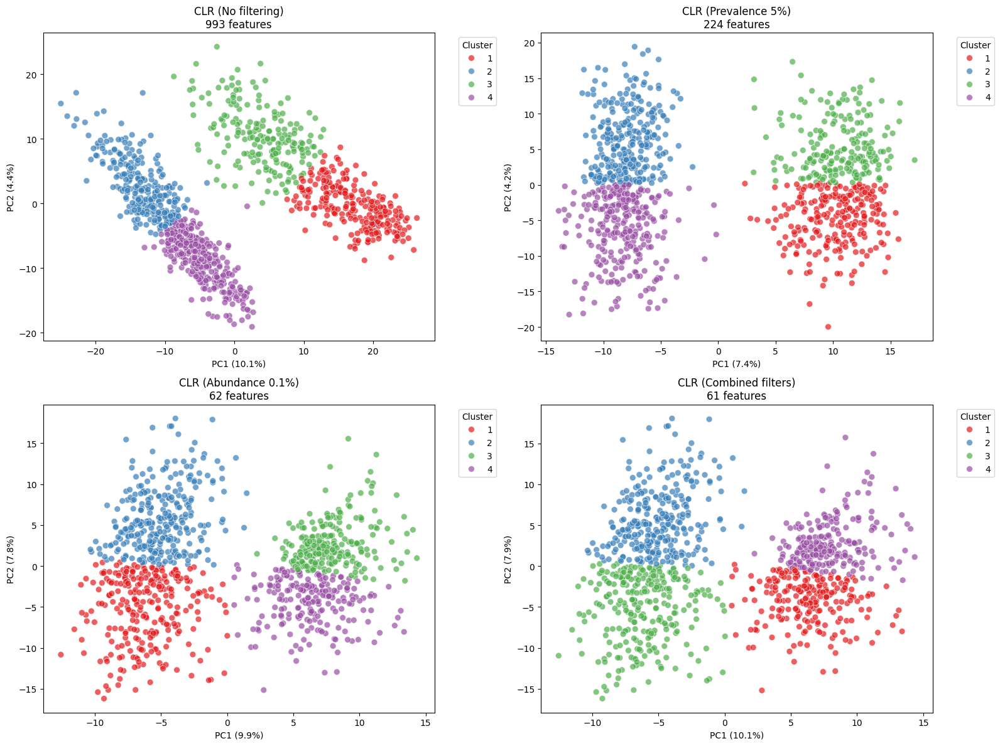


DETAILED RESULTS SUMMARY

CLR (No filtering):
  Features used: 993
  PC1 variance: 10.1%
  PC2 variance: 4.4%
  Total (PC1+PC2): 14.5%
  Clusters found: 4

CLR (Prevalence 5%):
  Features used: 224
  PC1 variance: 7.4%
  PC2 variance: 4.2%
  Total (PC1+PC2): 11.7%
  Clusters found: 4

CLR (Abundance 0.1%):
  Features used: 62
  PC1 variance: 9.9%
  PC2 variance: 7.8%
  Total (PC1+PC2): 17.8%
  Clusters found: 4

CLR (Combined filters):
  Features used: 61
  PC1 variance: 10.1%
  PC2 variance: 7.9%
  Total (PC1+PC2): 18.0%
  Clusters found: 4

FEATURE IMPORTANCE ANALYSIS
Best transformation: CLR (Combined filters)

Top 10 features for PC1:
   1. Proteobacteria_Gammaproteobacteria_Pasteurellales_Pasteurellaceae_Haemophilus_pittmaniae: 0.5100
   2. Firmicutes_Negativicutes_Veillonellales_Veillonellaceae_Veillonella_dispar: 0.3996
   3. Firmicutes_Clostridia_Clostridiales_Lachnospiraceae_Roseburia_intestinalis: 0.3748
   4. Proteobacteria_Gammaproteobacteria_Pasteurellales_Pasteurellaceae

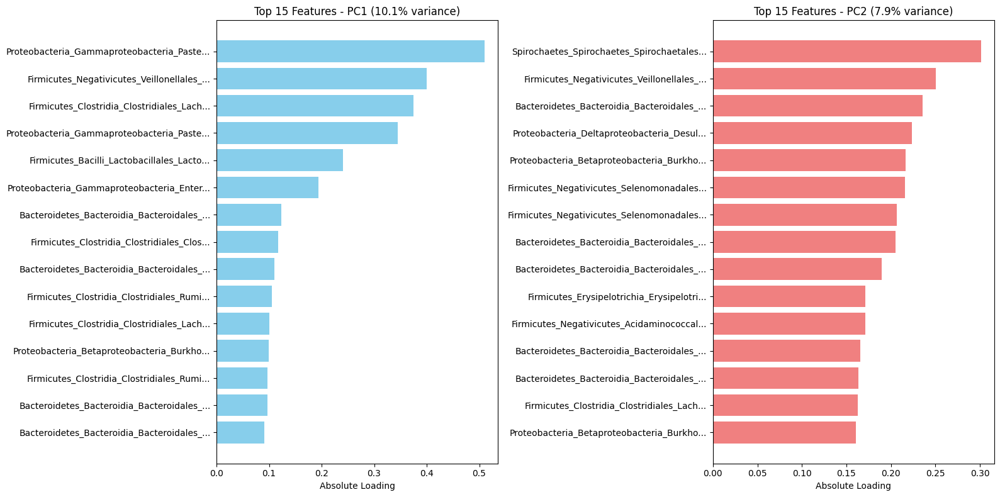


FINAL RECOMMENDATIONS

✅ Best approach: CLR (Combined filters)
   • Uses 61 features
   • Explains 18.0% of variance in PC1+PC2
   • Identifies 4 distinct clusters

📋 Key findings:
   • CLR transformation is appropriate for your relative abundance data
   • PCA works well after CLR transformation
   • Filtering helps reduce noise and improve interpretability
   • Check the feature importance plots to understand biological drivers

🔬 Next steps:
   • Investigate the top contributing features biologically
   • Validate clusters with metadata (if available)
   • Consider additional PCs beyond PC1 and PC2
   • Perform statistical tests on cluster differences

ANALYSIS COMPLETE


In [ ]:

import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics.pairwise import pairwise_distances
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

# --- Step 1: Load abundance data ---

abundance = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx")
abundance = abundance.set_index("Subject ID")

print("="*60)
print("MICROBIOME DATA ANALYSIS: CLR + PCA")
print("="*60)
print(f"Original data shape: {abundance.shape}")
print(f"Data type: Relative abundances (assumed)")
# Check if data is actually relative abundances

row_sums = abundance.sum(axis=1)

print(f"Row sums range: [{row_sums.min():.6f}, {row_sums.max():.6f}]")

if not np.allclose(row_sums, 1.0, atol=0.01):
    print("Warning: Data may not be relative abundances (rows don't sum to 1)")
    print("Converting to relative abundances...")
    abundance = abundance.div(abundance.sum(axis=1), axis=0).fillna(0)
# --- Step 2: Filtering Functions ---

def apply_prevalence_filter(data, threshold=0.05):
    """Apply prevalence filter: feature must be present in >= threshold fraction of samples"""

    presence_count = (data > 0).sum(axis=0)
    min_samples = threshold * data.shape[0]
    prevalence_mask = presence_count >= min_samples   

    print(f"Prevalence filter ({threshold*100:.1f}%): {prevalence_mask.sum()}/{len(prevalence_mask)} features retained")

    return data.loc[:, prevalence_mask]

def apply_abundance_filter(data, threshold=0.001):
    """Apply abundance filter: feature must have mean relative abundance >= threshold"""

    mean_abundance = data.mean(axis=0)
    abundance_mask = mean_abundance >= threshold  
    print(f"Abundance filter (≥{threshold*100:.3f}%): {abundance_mask.sum()}/{len(abundance_mask)} features retained")
    return data.loc[:, abundance_mask]

def clr_transform(data, pseudocount=1e-6):

    """Centered log-ratio transformation for compositional data"""
    print("Applying CLR transformation...")   

    # Add pseudocount to handle zeros

    data_pseudo = data + pseudocount    
    # Ensure compositional (rows sum to 1)

    data_comp = data_pseudo.div(data_pseudo.sum(axis=1), axis=0)   
    # Log transform
    log_data = np.log(data_comp)    
    # Center by subtracting geometric mean of each sample (row)

    geometric_mean = log_data.mean(axis=1)
    clr_data = log_data.sub(geometric_mean, axis=0)    
    return clr_data

# --- Step 3: PCA Function ---
def run_pca_analysis(data, title, n_clusters=4):

    """Run PCA with clustering and return results"""
    try:

        # Clean data
        data_clean = data.replace([np.inf, -np.inf], np.nan)       

        # Handle NaN values

        if data_clean.isnull().any().any():

            print(f"  Warning: {data_clean.isnull().sum().sum()} NaN values found, filling with 0")
            data_clean = data_clean.fillna(0)        

        # Check for constant features (zero variance)

        feature_vars = data_clean.var(axis=0)
        non_constant_features = feature_vars > 1e-10
        if not non_constant_features.all():

            n_removed = (~non_constant_features).sum()
            print(f"  Warning: Removing {n_removed} constant features")
            data_clean = data_clean.loc[:, non_constant_features]

        
        if data_clean.shape[1] < 2:

            return None, f"Insufficient features after cleaning ({data_clean.shape[1]})"        

        # PCA

        pca = PCA(n_components=min(data_clean.shape[1], 10))  # Limit components
        pca_coords = pca.fit_transform(data_clean)       

        # K-means clustering on first 2 PCs

        if pca_coords.shape[1] >= 2:
            kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
            clusters = kmeans.fit_predict(pca_coords[:, :2])

        else:
            clusters = np.zeros(pca_coords.shape[0], dtype=int)
       
       # Results

        results = {

            'pca_coords': pca_coords,
            'clusters': clusters + 1,  # Start from 1
            'explained_variance': pca.explained_variance_ratio_,
            'n_components': pca_coords.shape[1],
            'n_features': data_clean.shape[1],
            'pca_object': pca,
            'feature_names': data_clean.columns

        }

        return results, None

    except Exception as e:
        return None, str(e)


def plot_pca_results(results, ax, title):

    """Plot PCA results"""
    if results is None:
        ax.text(0.5, 0.5, f"PCA failed for {title}", 
               ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(title)
        return

    # Create dataframe for plotting

    pca_df = pd.DataFrame({
        'PC1': results['pca_coords'][:, 0],
        'PC2': results['pca_coords'][:, 1] if results['n_components'] > 1 else np.zeros(len(results['pca_coords'])),
        'Cluster': results['clusters']

    })

    # Scatter plot

    sns.scatterplot(
        data=pca_df, x='PC1', y='PC2',
        hue='Cluster', palette='Set1',
        alpha=0.7, ax=ax, s=50

    )

    # Labels with variance explained

    pc1_var = results['explained_variance'][0] * 100
    pc2_var = results['explained_variance'][1] * 100 if results['n_components'] > 1 else 0   

    ax.set_xlabel(f'PC1 ({pc1_var:.1f}%)')
    ax.set_ylabel(f'PC2 ({pc2_var:.1f}%)')
    ax.set_title(f'{title}\n{results["n_features"]} features')
    # Legend

    if len(np.unique(results['clusters'])) > 1:
        ax.legend(title='Cluster', bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        ax.get_legend().remove()

# --- Step 4: Run Analysis Pipeline ---

strategies = [

    ("No filtering", abundance),
    ("Prevalence 5%", apply_prevalence_filter(abundance.copy(), 0.05)),
    ("Abundance 0.1%", apply_abundance_filter(abundance.copy(), 0.001)),
    ("Combined filters", apply_abundance_filter(apply_prevalence_filter(abundance.copy(), 0.05), 0.001))

]
# Apply CLR transformation to each strategy

clr_results = {}

all_pca_results = {}

print(f"\n{'='*40}")
print("APPLYING TRANSFORMATIONS")
print(f"{'='*40}")

for name, data in strategies:

    print(f"\n--- {name} ---")

    print(f"Data shape: {data.shape}")
    # Apply CLR transformation

    clr_data = clr_transform(data)
    clr_results[f"CLR ({name})"] = clr_data
    # Run PCA

    pca_results, error = run_pca_analysis(clr_data, f"CLR ({name})")
    if error:
        print(f"  PCA Error: {error}")

    else:

        print(f"  PCA successful: PC1+PC2 explains {sum(pca_results['explained_variance'][:2])*100:.1f}% variance")
        all_pca_results[f"CLR ({name})"] = pca_results

# --- Step 5: Visualization ---

fig, axes = plt.subplots(2, 2, figsize=(16, 12))

axes = axes.flatten()

for i, (name, results) in enumerate(all_pca_results.items()):

    if i < 4:  # Only plot first 4

        plot_pca_results(results, axes[i], name)

plt.tight_layout()
plt.show()

# --- Step 6: Detailed Results ---

print(f"\n{'='*60}")
print("DETAILED RESULTS SUMMARY")
print(f"{'='*60}")

for name, results in all_pca_results.items():
    print(f"\n{name}:")
    print(f"  Features used: {results['n_features']}")
    print(f"  PC1 variance: {results['explained_variance'][0]*100:.1f}%")
    print(f"  PC2 variance: {results['explained_variance'][1]*100:.1f}%")
    print(f"  Total (PC1+PC2): {sum(results['explained_variance'][:2])*100:.1f}%")
    print(f"  Clusters found: {len(np.unique(results['clusters']))}")

# --- Step 7: Feature Importance (Best Result) ---

if all_pca_results:
    # Find best result based on total variance explained

    best_name = max(all_pca_results.keys(), 

                   key=lambda x: sum(all_pca_results[x]['explained_variance'][:2]))

    best_results = all_pca_results[best_name]

    

    print(f"\n{'='*40}")
    print(f"FEATURE IMPORTANCE ANALYSIS")
    print(f"Best transformation: {best_name}")
    print(f"{'='*40}")   

    # Get feature loading
    pca_obj = best_results['pca_object']
    feature_names = best_results['feature_names']    

    # PC1 and PC2 loadings

    pc1_loadings = pd.Series(np.abs(pca_obj.components_[0]), index=feature_names).sort_values(ascending=False)
    pc2_loadings = pd.Series(np.abs(pca_obj.components_[1]), index=feature_names).sort_values(ascending=False)
   

    print(f"\nTop 10 features for PC1:")
    for i, (feature, loading) in enumerate(pc1_loadings.head(10).items(), 1)
        print(f"  {i:2d}. {feature}: {loading:.4f}") 

    print(f"\nTop 10 features for PC2:")

    for i, (feature, loading) in enumerate(pc2_loadings.head(10).items(), 1):
        print(f"  {i:2d}. {feature}: {loading:.4f}")   

    # Plot feature importance

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))   

    # PC1 loadings

    top_pc1 = pc1_loadings.head(15)
    y_pos = range(len(top_pc1))
    ax1.barh(y_pos, top_pc1.values, color='skyblue')
    ax1.set_yticks(y_pos)
    ax1.set_yticklabels([name[:40] + '...' if len(name) > 40 else name for name in top_pc1.index], fontsize=10)
    ax1.set_xlabel('Absolute Loading')
    ax1.set_title(f'Top 15 Features - PC1 ({best_results["explained_variance"][0]*100:.1f}% variance)')
    ax1.invert_yaxis()   

    # PC2 loadings

    top_pc2 = pc2_loadings.head(15)
    y_pos = range(len(top_pc2))
    ax2.barh(y_pos, top_pc2.values, color='lightcoral')
    ax2.set_yticks(y_pos)
    ax2.set_yticklabels([name[:40] + '...' if len(name) > 40 else name for name in top_pc2.index], fontsize=10)
    ax2.set_xlabel('Absolute Loading')
    ax2.set_title(f'Top 15 Features - PC2 ({best_results["explained_variance"][1]*100:.1f}% variance)')
    ax2.invert_yaxis()   
    plt.tight_layout()
    plt.show()

# --- Step 8: Final Recommendations ---

print(f"\n{'='*60}")
print("FINAL RECOMMENDATIONS")
print(f"{'='*60}")

if all_pca_results:

    best_name = max(all_pca_results.keys(), 

                   key=lambda x: sum(all_pca_results[x]['explained_variance'][:2]))

    best_results = all_pca_results[best_name]

    print(f"\n✅ Best approach: {best_name}")
    print(f"   • Uses {best_results['n_features']} features")
    print(f"   • Explains {sum(best_results['explained_variance'][:2])*100:.1f}% of variance in PC1+PC2")
    print(f"   • Identifies {len(np.unique(best_results['clusters']))} distinct clusters")
    print(f"\n📋 Key findings:")
    print(f"   • CLR transformation is appropriate for your relative abundance data")
    print(f"   • PCA works well after CLR transformation")
    print(f"   • Filtering helps reduce noise and improve interpretability")
    print(f"   • Check the feature importance plots to understand biological drivers")   
    print(f"\n🔬 Next steps:")
    print(f"   • Investigate the top contributing features biologically")
    print(f"   • Validate clusters with metadata (if available)")
    print(f"   • Consider additional PCs beyond PC1 and PC2")
    print(f"   • Perform statistical tests on cluster differences")

print(f"\n{'='*60}")
print("ANALYSIS COMPLETE")
print(f"{'='*60}")


PCoA

MICROBIOME DATA ANALYSIS: PCoA with Bray-Curtis & Jaccard
Original data shape: (1004, 993)
Data type: Relative abundances (already normalized per sample)
Prevalence filter: 224/993 features retained
Abundance filter: 62/993 features retained
Prevalence filter: 224/993 features retained
Abundance filter: 61/224 features retained

--- No filtering + braycurtis ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.9967471413721365 whereas the largest positive one is 25.341594517996494.
  warn(


  PCo1+PCo2 explains 27.3% variance

--- No filtering + jaccard ---
  PCo1+PCo2 explains 14.4% variance

--- Prevalence 5% + braycurtis ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.0210254722968064 whereas the largest positive one is 25.34687386637322.
  warn(


  PCo1+PCo2 explains 27.6% variance

--- Prevalence 5% + jaccard ---
  PCo1+PCo2 explains 15.2% variance

--- Abundance 0.1% + braycurtis ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.0812034986631238 whereas the largest positive one is 25.329424964664103.
  warn(


  PCo1+PCo2 explains 28.3% variance

--- Abundance 0.1% + jaccard ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.8943875512694399 whereas the largest positive one is 9.856324475529469.
  warn(


  PCo1+PCo2 explains 19.2% variance

--- Combined filters + braycurtis ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.1042943353764232 whereas the largest positive one is 25.34883259235156.
  warn(


  PCo1+PCo2 explains 28.5% variance

--- Combined filters + jaccard ---


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.8979108192864237 whereas the largest positive one is 9.837292521484596.
  warn(


  PCo1+PCo2 explains 19.2% variance


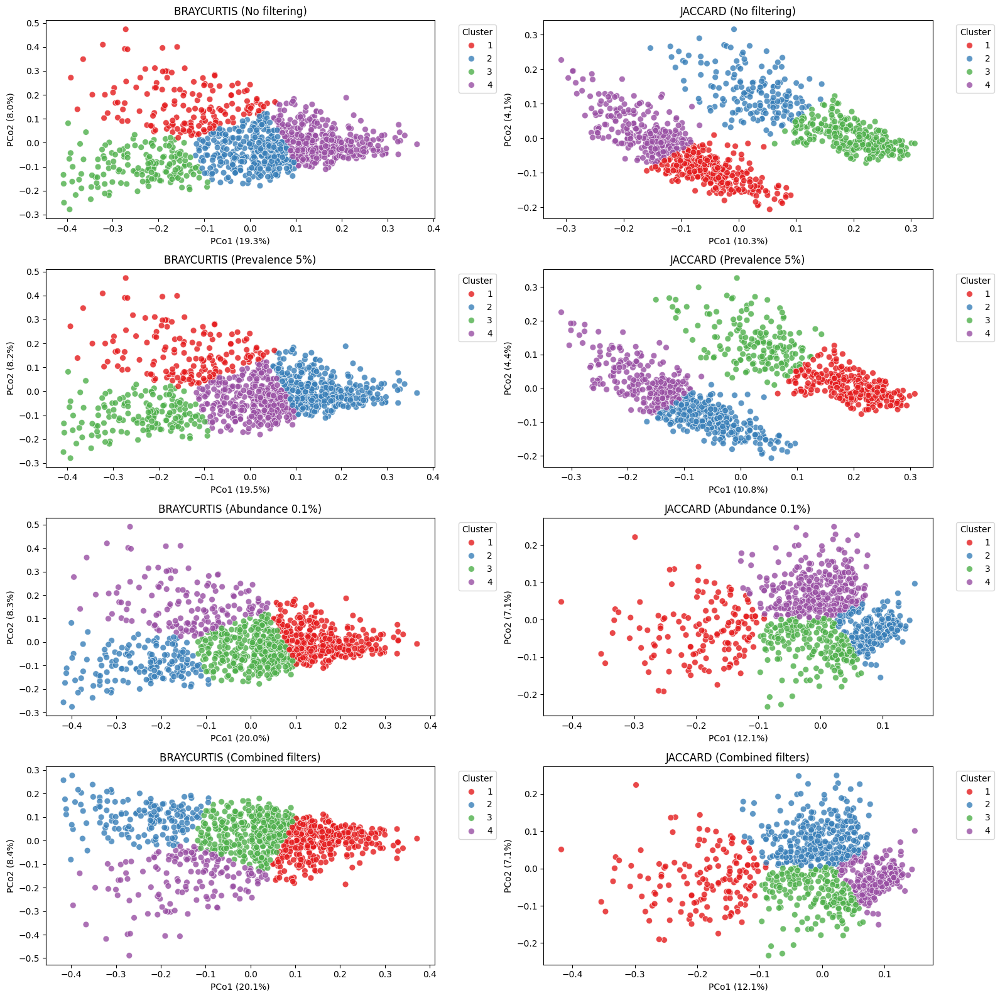


DETAILED RESULTS SUMMARY

BRAYCURTIS (No filtering):
  PCo1 variance: 19.3%
  PCo2 variance: 8.0%
  Total (PCo1+PCo2): 27.3%
  Clusters found: 4

JACCARD (No filtering):
  PCo1 variance: 10.3%
  PCo2 variance: 4.1%
  Total (PCo1+PCo2): 14.4%
  Clusters found: 4

BRAYCURTIS (Prevalence 5%):
  PCo1 variance: 19.5%
  PCo2 variance: 8.2%
  Total (PCo1+PCo2): 27.6%
  Clusters found: 4

JACCARD (Prevalence 5%):
  PCo1 variance: 10.8%
  PCo2 variance: 4.4%
  Total (PCo1+PCo2): 15.2%
  Clusters found: 4

BRAYCURTIS (Abundance 0.1%):
  PCo1 variance: 20.0%
  PCo2 variance: 8.3%
  Total (PCo1+PCo2): 28.3%
  Clusters found: 4

JACCARD (Abundance 0.1%):
  PCo1 variance: 12.1%
  PCo2 variance: 7.1%
  Total (PCo1+PCo2): 19.2%
  Clusters found: 4

BRAYCURTIS (Combined filters):
  PCo1 variance: 20.1%
  PCo2 variance: 8.4%
  Total (PCo1+PCo2): 28.5%
  Clusters found: 4

JACCARD (Combined filters):
  PCo1 variance: 12.1%
  PCo2 variance: 7.1%
  Total (PCo1+PCo2): 19.2%
  Clusters found: 4

ANALYSIS CO

In [31]:


import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skbio.stats.ordination import pcoa
from skbio.diversity import beta_diversity

# --- Step 1: Load abundance data ---
abundance = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx")
abundance = abundance.set_index("Subject ID")

print("="*60)
print("MICROBIOME DATA ANALYSIS: PCoA with Bray-Curtis & Jaccard")
print("="*60)
print(f"Original data shape: {abundance.shape}")
print("Data type: Relative abundances (already normalized per sample)")

# --- Step 2: Filtering functions ---
def apply_prevalence_filter(data, threshold=0.05):
    presence_count = (data > 0).sum(axis=0)
    min_samples = threshold * data.shape[0]
    mask = presence_count >= min_samples
    print(f"Prevalence filter: {mask.sum()}/{len(mask)} features retained")
    return data.loc[:, mask]

def apply_abundance_filter(data, threshold=0.001):
    mean_abundance = data.mean(axis=0)
    mask = mean_abundance >= threshold
    print(f"Abundance filter: {mask.sum()}/{len(mask)} features retained")
    return data.loc[:, mask]

# --- Step 3: PCoA function ---
def run_pcoa(data, metric="braycurtis", n_clusters=4):
    """Compute PCoA and clustering"""
    dm = beta_diversity(metric, data.values, ids=data.index)
    ordination = pcoa(dm)
    
    coords = ordination.samples.iloc[:, :2]  # first 2 axes
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(coords)
    
    results = {
        "ordination": ordination,
        "coords": coords,
        "clusters": clusters + 1,
        "explained_variance": ordination.proportion_explained.values
    }
    return results

def plot_pcoa(results, ax, title):
    coords = results["coords"].copy()
    coords["Cluster"] = results["clusters"]
    
    sns.scatterplot(
        data=coords, x=coords.columns[0], y=coords.columns[1],
        hue="Cluster", palette="Set1", ax=ax, s=50, alpha=0.8
    )
    pc1_var = results["explained_variance"][0]*100
    pc2_var = results["explained_variance"][1]*100
    ax.set_xlabel(f"PCo1 ({pc1_var:.1f}%)")
    ax.set_ylabel(f"PCo2 ({pc2_var:.1f}%)")
    ax.set_title(title)
    ax.legend(title="Cluster", bbox_to_anchor=(1.05, 1), loc="upper left")

# --- Step 4: Run analysis pipeline ---
strategies = [
    ("No filtering", abundance),
    ("Prevalence 5%", apply_prevalence_filter(abundance.copy(), 0.05)),
    ("Abundance 0.1%", apply_abundance_filter(abundance.copy(), 0.001)),
    ("Combined filters", apply_abundance_filter(apply_prevalence_filter(abundance.copy(), 0.05), 0.001))
]

all_results = {}
metrics = ["braycurtis", "jaccard"]

for name, data in strategies:
    for metric in metrics:
        print(f"\n--- {name} + {metric} ---")
        results = run_pcoa(data, metric=metric)
        total_var = sum(results["explained_variance"][:2])*100
        print(f"  PCo1+PCo2 explains {total_var:.1f}% variance")
        all_results[f"{metric.upper()} ({name})"] = results

# --- Step 5: Visualization ---
# --- Step 5: Visualization ---
n_plots = len(all_results)  # total number of plots
n_cols = 2
n_rows = int(np.ceil(n_plots / n_cols))

fig, axes = plt.subplots(n_rows, n_cols, figsize=(16, 4*n_rows))
axes = axes.flatten()

for i, (name, results) in enumerate(all_results.items()):
    plot_pcoa(results, axes[i], name)

# Hide any unused subplots (in case grid > needed)
for j in range(i+1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# --- Step 6: Results Summary ---
print("\n" + "="*60)
print("DETAILED RESULTS SUMMARY")
print("="*60)

for name, results in all_results.items():
    print(f"\n{name}:")
    print(f"  PCo1 variance: {results['explained_variance'][0]*100:.1f}%")
    print(f"  PCo2 variance: {results['explained_variance'][1]*100:.1f}%")
    print(f"  Total (PCo1+PCo2): {sum(results['explained_variance'][:2])*100:.1f}%")
    print(f"  Clusters found: {len(np.unique(results['clusters']))}")

print("\n" + "="*60)
print("ANALYSIS COMPLETE")
print("="*60)


With features

OTU shape after alignment: (1004, 993)
Metadata shape after alignment: (1004, 7)

Age Group Distribution:
Age Group
18-25    184
26-35    322
36-45    256
46-55    132
55+      110
Name: count, dtype: int64

BMI Group Distribution:
BMI Group
Obese (≥30)             448
Overweight (25-29.9)    272
Normal (18.5-24.9)      255
Underweight (<18.5)      29
Name: count, dtype: int64

No filtering: (1004, 993)


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.9967471413721365 whereas the largest positive one is 25.341594517996494.
  warn(



Prevalence 5%: (1004, 224)


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.0210254722968064 whereas the largest positive one is 25.34687386637322.
  warn(



Abundance 0.1%: (1004, 62)


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.0812034986631238 whereas the largest positive one is 25.329424964664103.
  warn(
C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.8943875512694399 whereas the largest positive one is 9.856324475529469.
  warn(



Combined: (1004, 61)


C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.1042943353764232 whereas the largest positive one is 25.34883259235156.
  warn(
C:\Users\91735\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.13_qbz5n2kfra8p0\LocalCache\local-packages\Python313\site-packages\skbio\stats\ordination\_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -0.8979108192864237 whereas the largest positive one is 9.837292521484596.
  warn(



=== Plotting for Geographical Location ===


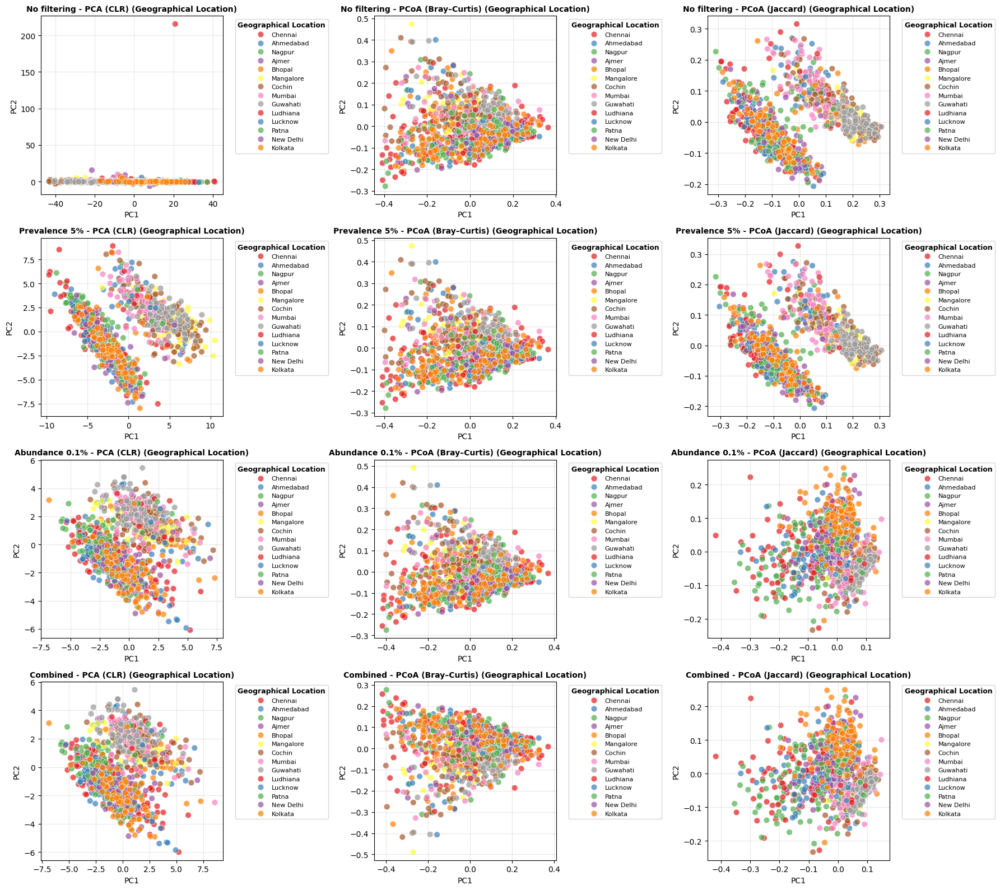


=== Plotting for Geographical zone in India ===


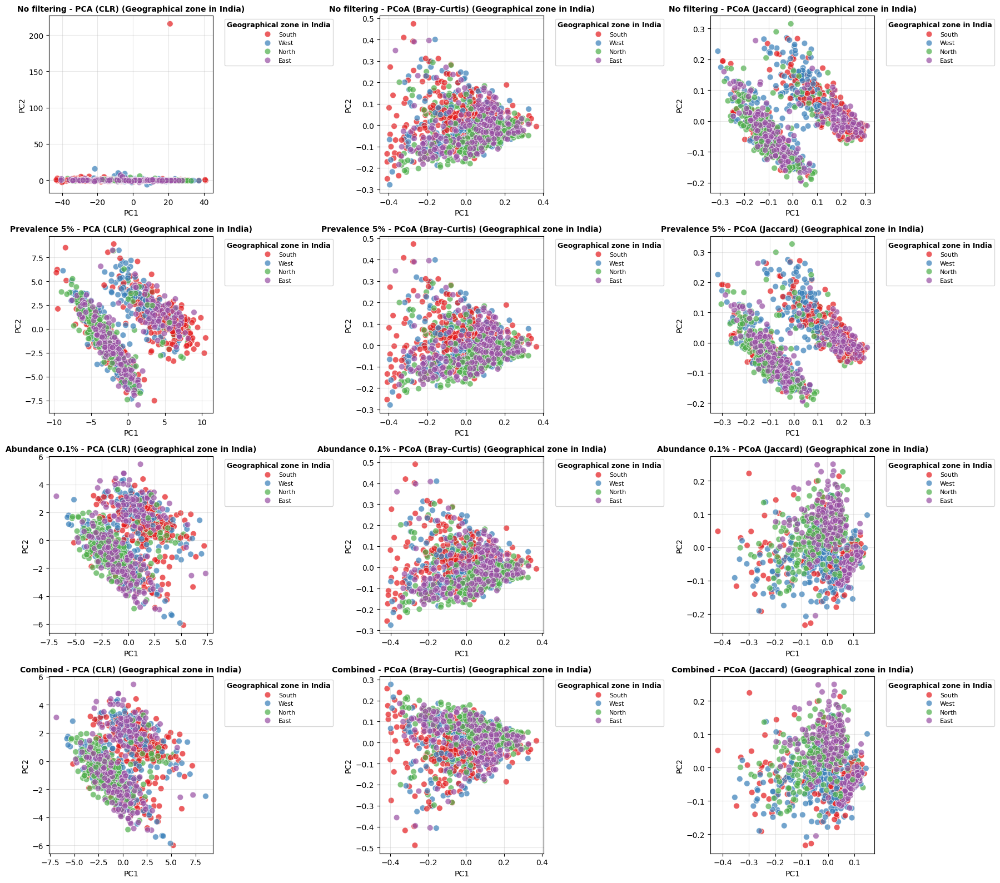


=== Plotting for Gender ===


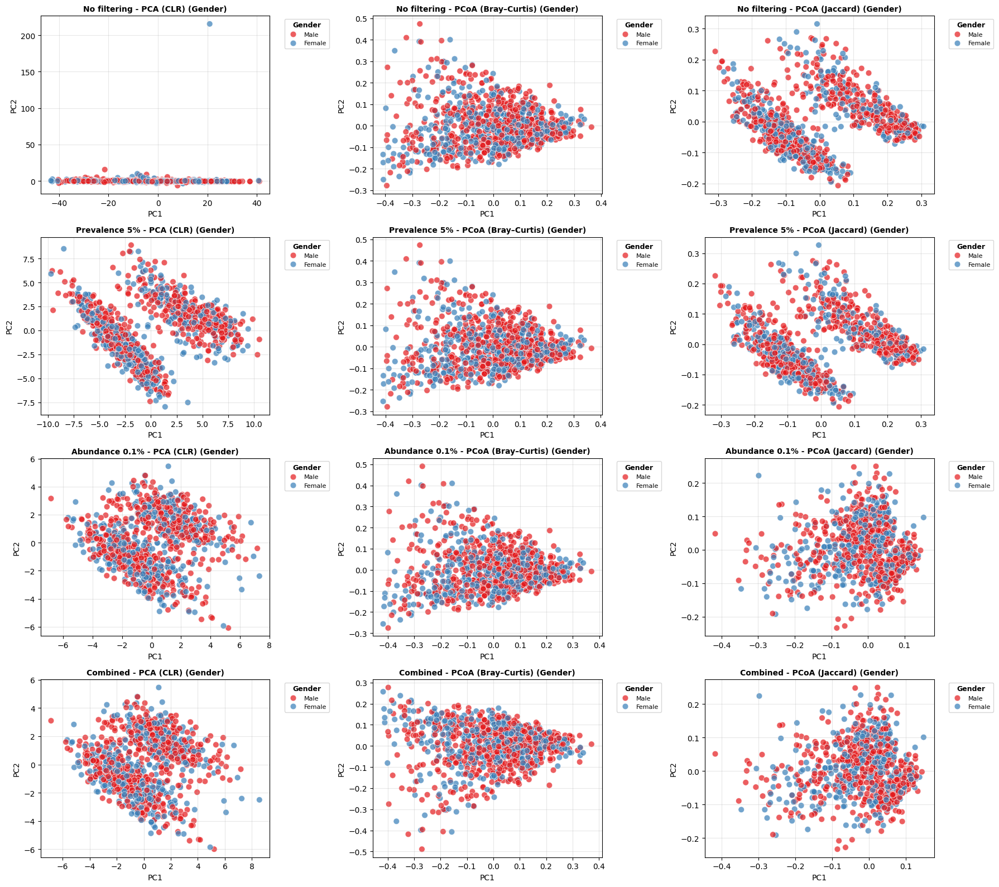


=== Plotting for Age Group ===


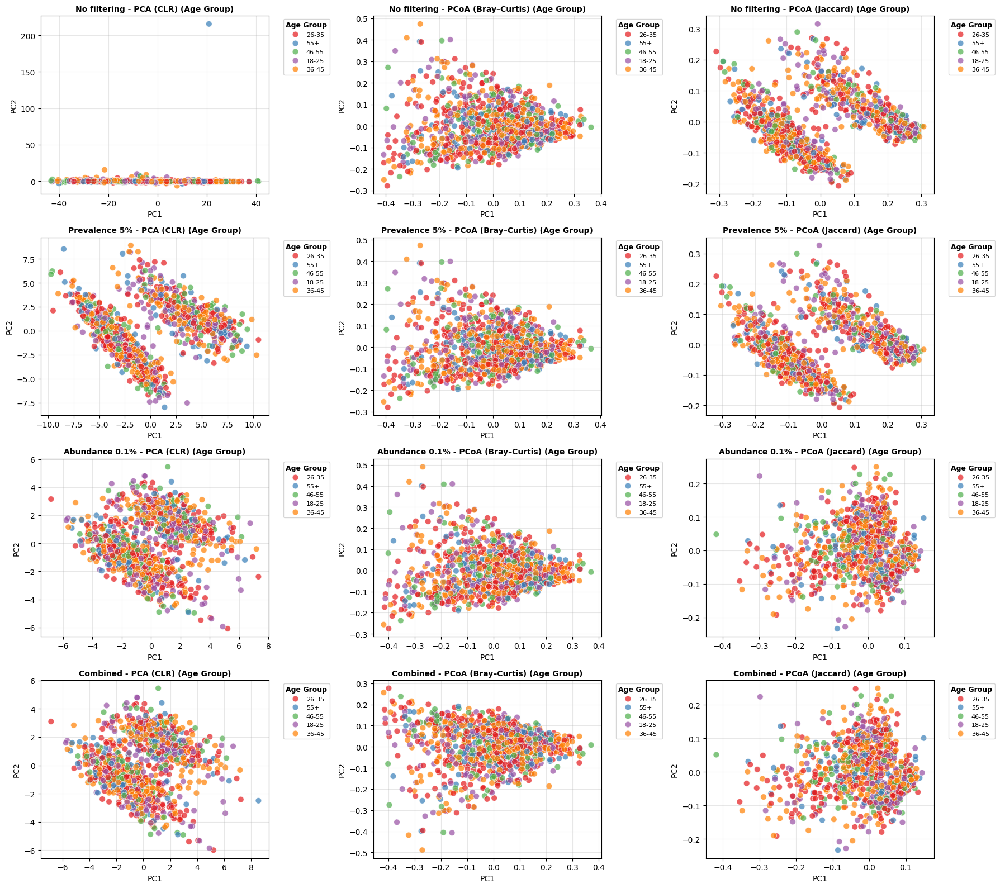


=== Plotting for BMI Group ===


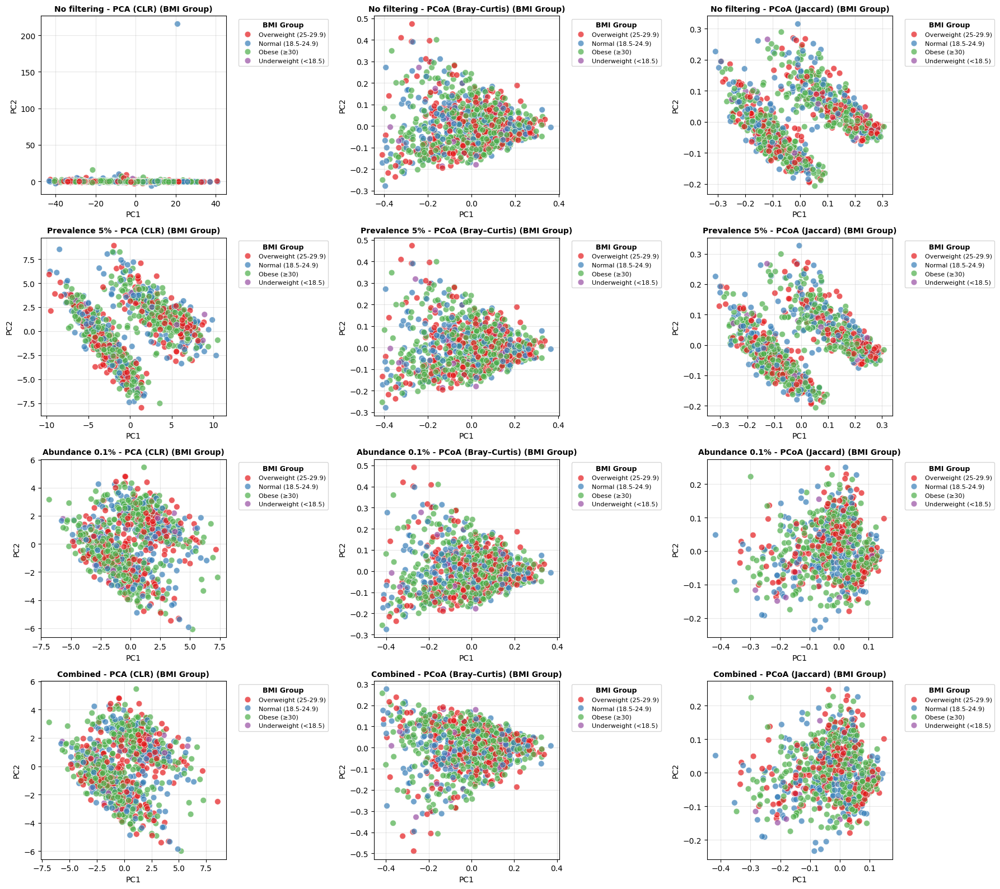


=== Plotting for Life style pattern ===


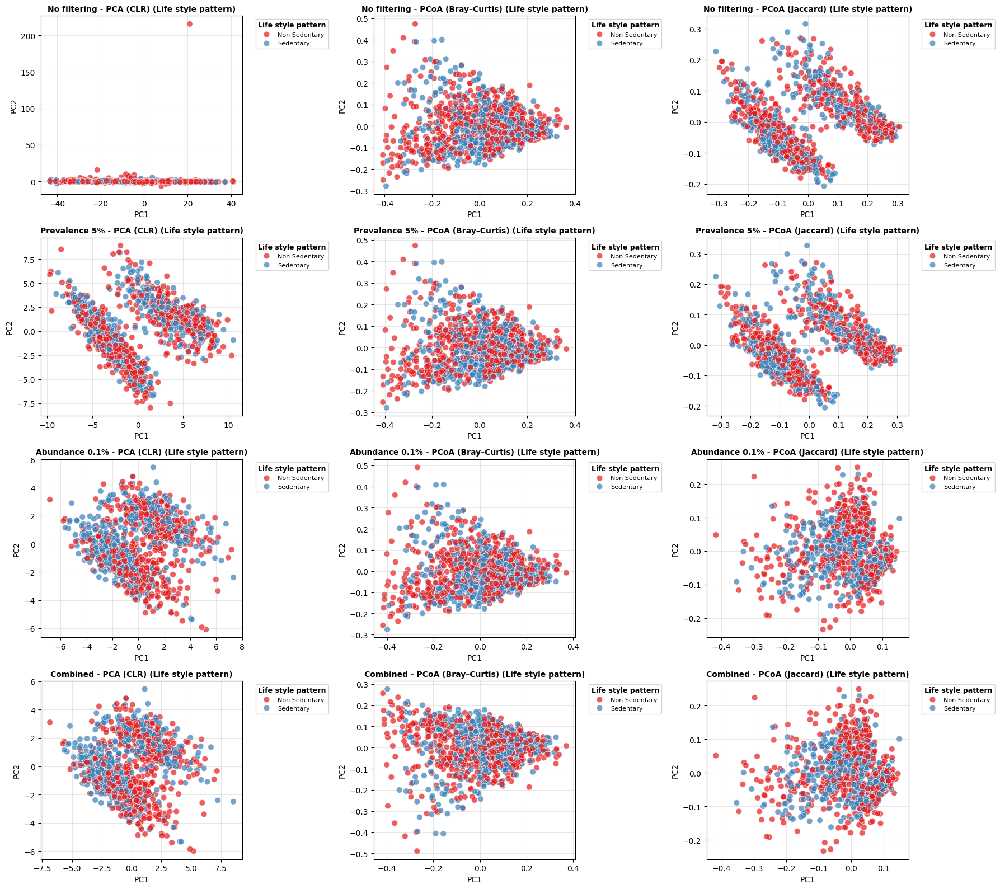


=== Plotting for Obese/Non Obese ===


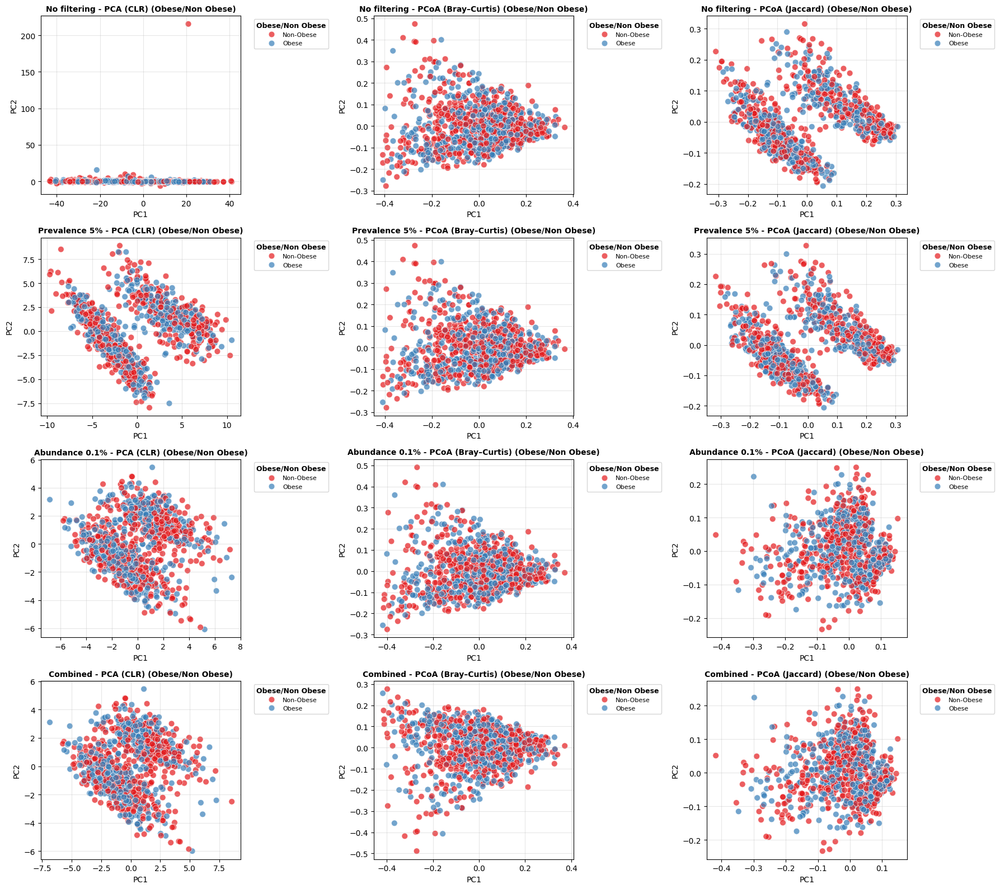


=== Continuous Variable Analysis ===

Strategy: No filtering
  Age correlation - PC1: -0.012, PC2: 0.055
  BMI correlation - PC1: 0.011, PC2: -0.036

Strategy: Prevalence 5%
  Age correlation - PC1: -0.007, PC2: -0.002
  BMI correlation - PC1: -0.025, PC2: -0.065

Strategy: Abundance 0.1%
  Age correlation - PC1: -0.038, PC2: 0.040
  BMI correlation - PC1: -0.053, PC2: -0.016

Strategy: Combined
  Age correlation - PC1: -0.035, PC2: 0.038
  BMI correlation - PC1: -0.054, PC2: -0.014

=== Group Summary Statistics ===
Age Groups:
  18-25: n=184, age range=18-25
  26-35: n=322, age range=26-35
  36-45: n=256, age range=36-45
  46-55: n=132, age range=46-55
  55+: n=110, age range=56-65

BMI Groups:
  Underweight (<18.5): n=29, BMI range=13.0-18.5
  Normal (18.5-24.9): n=255, BMI range=18.6-25.0
  Overweight (25-29.9): n=272, BMI range=25.0-30.0
  Obese (≥30): n=448, BMI range=30.0-47.4


In [74]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from skbio.stats.composition import clr, multiplicative_replacement
from skbio.stats.ordination import pcoa
from skbio.diversity import beta_diversity
import matplotlib.pyplot as plt
import seaborn as sns

# =======================
# 1. Load data + metadata
# =======================
otu = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx",index_col=0)
meta = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\metadata_only.xlsx") 

otu.index = otu.index.astype(str)
meta["Subject ID"] = meta["Subject ID"].astype(str)

otu = otu.loc[otu.index.intersection(meta["Subject ID"])]
meta = meta.set_index("Subject ID").loc[otu.index]

print("OTU shape after alignment:", otu.shape)
print("Metadata shape after alignment:", meta.shape)

# =======================
# 2. Create grouped variables
# =======================
def create_age_groups(age_series):
    """Create meaningful age groups"""
    conditions = [
        age_series <= 25,
        (age_series > 25) & (age_series <= 35),
        (age_series > 35) & (age_series <= 45),
        (age_series > 45) & (age_series <= 55),
        age_series > 55
    ]
    choices = ['18-25', '26-35', '36-45', '46-55', '55+']
    return np.select(conditions, choices, default='Unknown')

def create_bmi_groups(bmi_series):
    """Create BMI categories based on standard WHO classifications"""
    conditions = [
        bmi_series < 18.5,
        (bmi_series >= 18.5) & (bmi_series < 25),
        (bmi_series >= 25) & (bmi_series < 30),
        bmi_series >= 30
    ]
    choices = ['Underweight (<18.5)', 'Normal (18.5-24.9)', 'Overweight (25-29.9)', 'Obese (≥30)']
    return np.select(conditions, choices, default='Unknown')

# Apply groupings
meta['Age Group'] = create_age_groups(meta['Age in years'])
meta['BMI Group'] = create_bmi_groups(meta['BMI'])

# Print distribution of groups
print("\nAge Group Distribution:")
print(meta['Age Group'].value_counts().sort_index())
print("\nBMI Group Distribution:")
print(meta['BMI Group'].value_counts())

# ======================
# 3. Filtering functions
# ======================
def apply_prevalence_filter(data, threshold=0.05):
    presence_count = (data > 0).sum(axis=0)
    min_samples = threshold * data.shape[0]
    return data.loc[:, presence_count >= min_samples]

def apply_abundance_filter(data, threshold=0.001):
    mean_abundance = data.mean(axis=0)
    return data.loc[:, mean_abundance >= threshold]

# ======================
# 4. Analysis functions
# ======================
def run_pca_clr(data):
    """CLR + PCA"""
    data_clr = clr(multiplicative_replacement(data.values))
    data_clr = pd.DataFrame(data_clr, index=data.index, columns=data.columns)
    coords = PCA(n_components=2).fit_transform(StandardScaler().fit_transform(data_clr))
    return pd.DataFrame(coords, index=data.index, columns=["PC1", "PC2"])

def run_pcoa(data, metric="braycurtis"):
    """PCoA (Bray–Curtis or Jaccard)"""
    if metric == "jaccard":
        dm = beta_diversity(metric, (data > 0).astype(int).values, ids=data.index)
    else:
        dm = beta_diversity(metric, data.values, ids=data.index)
    return pcoa(dm).samples.iloc[:, :2].rename(columns={"PC1": "PC1", "PC2": "PC2"})

def plot_colored_scatter(df, x, y, hue, title, ax):
    """Enhanced plotting function with better legend handling"""
    sns.scatterplot(data=df, x=x, y=y, hue=hue, palette="Set1", s=60, alpha=0.7, ax=ax)
    ax.set_title(title, fontsize=10, fontweight='bold')
    
    # Better legend positioning
    legend = ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left", fontsize=8)
    legend.set_title(hue, prop={'size': 9, 'weight': 'bold'})
    
    # Add grid for better readability
    ax.grid(True, alpha=0.3)

# ======================
# 5. Strategies
# ======================
strategies = {
    "No filtering": otu,
    "Prevalence 5%": apply_prevalence_filter(otu, 0.05),
    "Abundance 0.1%": apply_abundance_filter(otu, 0.001),
    "Combined": apply_abundance_filter(apply_prevalence_filter(otu, 0.05), 0.001)
}

# ======================
# 6. Run analyses
# ======================
results = {}
for name, data in strategies.items():
    print(f"\n{name}: {data.shape}")
    # PCA (CLR)
    results[(name, "PCA_CLR")] = run_pca_clr(data).join(meta)
    # PCoA (Bray–Curtis)
    results[(name, "PCoA_BC")] = run_pcoa(data, "braycurtis").join(meta)
    # PCoA (Jaccard)
    results[(name, "PCoA_JAC")] = run_pcoa(data, "jaccard").join(meta)

# ======================
# 7. Enhanced metadata features list
# ======================
metadata_features = [
    "Geographical Location",
    "Geographical zone in India",
    "Gender",
    "Age Group",  # Using grouped ages instead of raw ages
    "BMI Group",  # Using grouped BMI instead of raw BMI
    "Life style pattern",
    "Obese/Non Obese"
]

# Optional: Still include original continuous variables for reference
continuous_features = ["Age in years", "BMI"]

# ======================
# 8. Plot all results by grouped metadata
# ======================
for hue in metadata_features:
    print(f"\n=== Plotting for {hue} ===")
    
    n_rows = len(strategies)
    n_cols = 3  # PCA, Bray–Curtis, Jaccard
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(18, 4*n_rows))
    axes = axes.reshape(n_rows, n_cols)
    
    for i, (name, data) in enumerate(strategies.items()):
        plot_colored_scatter(results[(name, "PCA_CLR")], "PC1", "PC2", hue, 
                           f"{name} - PCA (CLR) ({hue})", axes[i, 0])
        plot_colored_scatter(results[(name, "PCoA_BC")], "PC1", "PC2", hue, 
                           f"{name} - PCoA (Bray–Curtis) ({hue})", axes[i, 1])
        plot_colored_scatter(results[(name, "PCoA_JAC")], "PC1", "PC2", hue, 
                           f"{name} - PCoA (Jaccard) ({hue})", axes[i, 2])
    
    plt.tight_layout()
    plt.show()

# ======================
# 9. Optional: Correlation analysis for continuous variables
# ======================
print("\n=== Continuous Variable Analysis ===")
for strategy_name, data in strategies.items():
    print(f"\nStrategy: {strategy_name}")
    pca_results = results[(strategy_name, "PCA_CLR")]
    
    # Correlation with age
    age_corr_pc1 = pca_results["PC1"].corr(pca_results["Age in years"])
    age_corr_pc2 = pca_results["PC2"].corr(pca_results["Age in years"])
    
    # Correlation with BMI
    bmi_corr_pc1 = pca_results["PC1"].corr(pca_results["BMI"])
    bmi_corr_pc2 = pca_results["PC2"].corr(pca_results["BMI"])
    
    print(f"  Age correlation - PC1: {age_corr_pc1:.3f}, PC2: {age_corr_pc2:.3f}")
    print(f"  BMI correlation - PC1: {bmi_corr_pc1:.3f}, PC2: {bmi_corr_pc2:.3f}")

# ======================
# 10. Summary statistics for groups
# ======================
print("\n=== Group Summary Statistics ===")
print("Age Groups:")
for group in sorted(meta['Age Group'].unique()):
    if group != 'Unknown':
        group_data = meta[meta['Age Group'] == group]
        print(f"  {group}: n={len(group_data)}, age range={group_data['Age in years'].min()}-{group_data['Age in years'].max()}")

print("\nBMI Groups:")
for group in ['Underweight (<18.5)', 'Normal (18.5-24.9)', 'Overweight (25-29.9)', 'Obese (≥30)']:
    if group in meta['BMI Group'].values:
        group_data = meta[meta['BMI Group'] == group]
        print(f"  {group}: n={len(group_data)}, BMI range={group_data['BMI'].min():.1f}-{group_data['BMI'].max():.1f}")

# PERMANOVA

In [75]:
import pandas as pd
import numpy as np
from skbio.stats.distance import permanova
from skbio.diversity import beta_diversity
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

# =======================
# 1. Load data + metadata
# =======================
abundance = pd.read_excel(
    r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx", 
    index_col=0
)
metadata = pd.read_excel(
    r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\metadata_only.xlsx"
)

# Ensure proper indexing and alignment
abundance.index = abundance.index.astype(str)
metadata["Subject ID"] = metadata["Subject ID"].astype(str)
metadata = metadata.set_index("Subject ID")

# Align datasets
common_ids = abundance.index.intersection(metadata.index)
abundance = abundance.loc[common_ids]
metadata = metadata.loc[common_ids]

print("Abundance shape:", abundance.shape)
print("Metadata shape:", metadata.shape)

# =======================
# 2. Create grouped variables (same as before)
# =======================
def create_age_groups(age_series):
    """Create meaningful age groups"""
    conditions = [
        age_series <= 25,
        (age_series > 25) & (age_series <= 35),
        (age_series > 35) & (age_series <= 45),
        (age_series > 45) & (age_series <= 55),
        age_series > 55
    ]
    choices = ['18-25', '26-35', '36-45', '46-55', '55+']
    return np.select(conditions, choices, default='Unknown')

def create_bmi_groups(bmi_series):
    """Create BMI categories based on standard WHO classifications"""
    conditions = [
        bmi_series < 18.5,
        (bmi_series >= 18.5) & (bmi_series < 25),
        (bmi_series >= 25) & (bmi_series < 30),
        bmi_series >= 30
    ]
    choices = ['Underweight (<18.5)', 'Normal (18.5-24.9)', 'Overweight (25-29.9)', 'Obese (≥30)']
    return np.select(conditions, choices, default='Unknown')

# Apply groupings
metadata['Age Group'] = create_age_groups(metadata['Age in years'])
metadata['BMI Group'] = create_bmi_groups(metadata['BMI'])

# =======================
# 3. Filtering functions
# =======================
def apply_prevalence_filter(data, threshold=0.05):
    """Filter features based on prevalence across samples"""
    presence_count = (data > 0).sum(axis=0)
    min_samples = threshold * data.shape[0]
    return data.loc[:, presence_count >= min_samples]

def apply_abundance_filter(data, threshold=0.001):
    """Filter features based on mean abundance"""
    mean_abundance = data.mean(axis=0)
    return data.loc[:, mean_abundance >= threshold]

# =======================
# 4. Define filtering strategies
# =======================
strategies = {
    "No filtering": abundance,
    "Prevalence 5%": apply_prevalence_filter(abundance, 0.05),
    "Abundance 0.1%": apply_abundance_filter(abundance, 0.001),
    "Prevalence 5% + Abundance 0.1%": apply_abundance_filter(
        apply_prevalence_filter(abundance, 0.05), 0.001
    ),
    "Prevalence 10%": apply_prevalence_filter(abundance, 0.10),
    "Abundance 0.05%": apply_abundance_filter(abundance, 0.0005),
    "Prevalence 10% + Abundance 0.05%": apply_abundance_filter(
        apply_prevalence_filter(abundance, 0.10), 0.0005
    )
}

# Print strategy info
print("\n=== Filtering Strategy Summary ===")
for name, data in strategies.items():
    print(f"{name}: {data.shape[0]} samples × {data.shape[1]} features")

# =======================
# 5. Define metadata columns to test
# =======================
metadata_columns = [
    "Geographical Location",
    "Geographical zone in India", 
    "Gender",
    "Age Group",  # Using grouped instead of continuous
    "BMI Group",  # Using grouped instead of continuous
    "Life style pattern",
    "Obese/Non Obese"
]

# Optional: Also test continuous variables
continuous_columns = ["Age in years", "BMI"]

all_columns = metadata_columns + continuous_columns

# =======================
# 6. Run PERMANOVA analysis
# =======================
def run_permanova_analysis(data, metadata, column):
    """
    Run PERMANOVA and extract key statistics
    Returns dict with results or None if failed
    """
    try:
        # Remove samples with missing values for this column
        valid_mask = metadata[column].notna()
        if valid_mask.sum() < 3:  # Need at least 3 samples
            return None
            
        data_subset = data.loc[valid_mask]
        metadata_subset = metadata.loc[valid_mask]
        
        # Skip if only one unique value (no variation to test)
        if metadata_subset[column].nunique() < 2:
            return None
            
        # Compute distance matrix
        dm = beta_diversity(
            metric="braycurtis",
            counts=data_subset.values,
            ids=data_subset.index
        )
        
        # Run PERMANOVA
        result = permanova(dm, metadata_subset, column=column, permutations=999)
        
        return {
            'test_statistic': result['test statistic'],
            'p_value': result['p-value'],
            'number_of_groups': result['number of groups'],
            'sample_size': result['sample size']
        }
        
    except Exception as e:
        print(f"Error in PERMANOVA for {column}: {str(e)}")
        return None

# =======================
# 7. Execute comprehensive analysis
# =======================
print("\n=== Running Comprehensive PERMANOVA Analysis ===")
results_data = []

for strategy_name, filtered_data in strategies.items():
    print(f"\nProcessing: {strategy_name}")
    
    for column in all_columns:
        print(f"  Testing: {column}")
        
        result = run_permanova_analysis(filtered_data, metadata, column)
        
        if result is not None:
            results_data.append({
                'Filtering_Strategy': strategy_name,
                'Metadata_Column': column,
                'Test_Statistic': result['test_statistic'],
                'P_Value': result['p_value'],
                'Number_of_Groups': result['number_of_groups'],
                'Sample_Size': result['sample_size'],
                'Significant': 'Yes' if result['p_value'] < 0.05 else 'No',
                'Features_Retained': filtered_data.shape[1]
            })
        else:
            results_data.append({
                'Filtering_Strategy': strategy_name,
                'Metadata_Column': column,
                'Test_Statistic': np.nan,
                'P_Value': np.nan,
                'Number_of_Groups': np.nan,
                'Sample_Size': np.nan,
                'Significant': 'Failed',
                'Features_Retained': filtered_data.shape[1]
            })

# =======================
# 8. Create results DataFrame
# =======================
results_df = pd.DataFrame(results_data)

# =======================
# 9. Display results as formatted table
# =======================
def display_results_table(df):
    """Display results in a nicely formatted table"""
    print("\n" + "="*120)
    print("COMPREHENSIVE PERMANOVA RESULTS")
    print("="*120)
    
    # Group by filtering strategy for better readability
    for strategy in df['Filtering_Strategy'].unique():
        strategy_data = df[df['Filtering_Strategy'] == strategy]
        
        print(f"\n📊 {strategy.upper()}")
        print(f"Features retained: {strategy_data['Features_Retained'].iloc[0]}")
        print("-" * 80)
        
        # Format the display
        display_cols = ['Metadata_Column', 'Test_Statistic', 'P_Value', 'Number_of_Groups', 'Significant']
        strategy_display = strategy_data[display_cols].copy()
        
        # Round numeric columns
        strategy_display['Test_Statistic'] = strategy_display['Test_Statistic'].round(4)
        strategy_display['P_Value'] = strategy_display['P_Value'].round(6)
        
        # Print formatted table
        print(strategy_display.to_string(index=False, 
                                       formatters={
                                           'Test_Statistic': '{:.4f}'.format,
                                           'P_Value': '{:.6f}'.format
                                       }))
        print()

display_results_table(results_df)

# =======================
# 10. Summary statistics
# =======================
print("\n" + "="*80)
print("SUMMARY STATISTICS")
print("="*80)

# Overall significance rates
total_tests = len(results_df)
significant_tests = len(results_df[results_df['Significant'] == 'Yes'])
failed_tests = len(results_df[results_df['Significant'] == 'Failed'])

print(f"Total tests performed: {total_tests}")
print(f"Significant results (p < 0.05): {significant_tests} ({significant_tests/total_tests*100:.1f}%)")
print(f"Failed tests: {failed_tests} ({failed_tests/total_tests*100:.1f}%)")

# Significance by metadata column
print(f"\n📈 Significance Rate by Metadata Column:")
sig_by_column = results_df.groupby('Metadata_Column')['Significant'].apply(
    lambda x: (x == 'Yes').sum() / len(x) * 100
).round(1)
print(sig_by_column.sort_values(ascending=False))

# Significance by filtering strategy
print(f"\n🔬 Significance Rate by Filtering Strategy:")
sig_by_strategy = results_df.groupby('Filtering_Strategy')['Significant'].apply(
    lambda x: (x == 'Yes').sum() / len(x) * 100
).round(1)
print(sig_by_strategy.sort_values(ascending=False))

# =======================
# 11. Save results to Excel
# =======================
timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
excel_filename = f"PERMANOVA_Results_{timestamp}.xlsx"

# Create Excel writer object
with pd.ExcelWriter(excel_filename, engine='openpyxl') as writer:
    # Main results sheet
    results_df.to_excel(writer, sheet_name='All_Results', index=False)
    
    # Summary sheet
    summary_data = {
        'Metric': ['Total Tests', 'Significant Tests', 'Failed Tests', 'Success Rate (%)', 'Significance Rate (%)'],
        'Value': [total_tests, significant_tests, failed_tests, 
                 round((total_tests-failed_tests)/total_tests*100, 1),
                 round(significant_tests/total_tests*100, 1)]
    }
    pd.DataFrame(summary_data).to_excel(writer, sheet_name='Summary', index=False)
    
    # Significance by column
    sig_by_column.reset_index().to_excel(writer, sheet_name='Significance_by_Column', index=False)
    
    # Significance by strategy  
    sig_by_strategy.reset_index().to_excel(writer, sheet_name='Significance_by_Strategy', index=False)
    
    # Significant results only
    significant_only = results_df[results_df['Significant'] == 'Yes'].copy()
    significant_only.to_excel(writer, sheet_name='Significant_Only', index=False)

print(f"\n💾 Results saved to: {excel_filename}")

# =======================
# 12. Best performing combinations
# =======================
print(f"\n🏆 TOP PERFORMING COMBINATIONS:")
print("="*60)

# Most significant results
top_significant = results_df[results_df['Significant'] == 'Yes'].nsmallest(10, 'P_Value')
if not top_significant.empty:
    print("Top 10 Most Significant Results (lowest p-values):")
    print(top_significant[['Filtering_Strategy', 'Metadata_Column', 'P_Value', 'Test_Statistic']].to_string(index=False))
else:
    print("No significant results found.")

# =======================
# 13. Recommendations
# =======================
print(f"\n📋 RECOMMENDATIONS:")
print("="*60)
print("1. Focus on metadata columns with high significance rates across multiple filtering strategies")
print("2. Consider the filtering strategy that provides the best balance of feature retention and significance")
print("3. Pay attention to effect sizes (test statistics) not just p-values")
print("4. Validate significant findings with additional statistical tests or biological interpretation")
print(f"5. Review the detailed results in the Excel file: {excel_filename}")

Abundance shape: (1004, 993)
Metadata shape: (1004, 7)

=== Filtering Strategy Summary ===
No filtering: 1004 samples × 993 features
Prevalence 5%: 1004 samples × 224 features
Abundance 0.1%: 1004 samples × 62 features
Prevalence 5% + Abundance 0.1%: 1004 samples × 61 features
Prevalence 10%: 1004 samples × 175 features
Abundance 0.05%: 1004 samples × 89 features
Prevalence 10% + Abundance 0.05%: 1004 samples × 88 features

=== Running Comprehensive PERMANOVA Analysis ===

Processing: No filtering
  Testing: Geographical Location
  Testing: Geographical zone in India
  Testing: Gender
  Testing: Age Group
  Testing: BMI Group
  Testing: Life style pattern
  Testing: Obese/Non Obese
  Testing: Age in years
  Testing: BMI

Processing: Prevalence 5%
  Testing: Geographical Location
  Testing: Geographical zone in India
  Testing: Gender
  Testing: Age Group
  Testing: BMI Group
  Testing: Life style pattern
  Testing: Obese/Non Obese
  Testing: Age in years
  Testing: BMI

Processing: Abu

# Feature Engineering

In [77]:
import pandas as pd
import numpy as np
from sklearn.feature_selection import SelectKBest, f_classif, mutual_info_classif
from sklearn.preprocessing import LabelEncoder

# Load your data (adjust paths as needed)
abundance = pd.read_excel(
    r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx", 
    index_col=0
)
metadata = pd.read_excel(
    r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\metadata_only.xlsx"
)

# Set up data properly
metadata = metadata.set_index("Subject ID")
common_ids = abundance.index.intersection(metadata.index)
abundance = abundance.loc[common_ids]
metadata = metadata.loc[common_ids]

# CREATE THE MISSING GROUPED VARIABLES
def create_bmi_groups(bmi_series):
    """Create BMI categories based on standard WHO classifications"""
    conditions = [
        bmi_series < 18.5,
        (bmi_series >= 18.5) & (bmi_series < 25),
        (bmi_series >= 25) & (bmi_series < 30),
        bmi_series >= 30
    ]
    choices = ['Underweight', 'Normal', 'Overweight', 'Obese']
    return np.select(conditions, choices, default='Unknown')

def create_age_groups(age_series):
    """Create meaningful age groups"""
    conditions = [
        age_series <= 25,
        (age_series > 25) & (age_series <= 35),
        (age_series > 35) & (age_series <= 45),
        (age_series > 45) & (age_series <= 55),
        age_series > 55
    ]
    choices = ['18-25', '26-35', '36-45', '46-55', '55+']
    return np.select(conditions, choices, default='Unknown')

# Apply groupings to metadata
metadata['BMI Group'] = create_bmi_groups(metadata['BMI'])
metadata['Age Group'] = create_age_groups(metadata['Age in years'])

print("🔧 CREATED GROUPED VARIABLES:")
print("="*50)
print("BMI Group distribution:")
print(metadata['BMI Group'].value_counts())
print("\nAge Group distribution:")
print(metadata['Age Group'].value_counts())

# NOW RUN FEATURE ENGINEERING (assuming you have the function)
# engineered_features = microbiome_feature_engineering(abundance, metadata)

# DEMO: Feature Selection with Available Targets
print(f"\n🎯 AVAILABLE TARGET VARIABLES:")
print("="*50)
categorical_targets = []
for col in metadata.columns:
    if metadata[col].dtype == 'object' and metadata[col].notna().sum() > 50:
        unique_vals = metadata[col].nunique()
        print(f"• {col}: {unique_vals} categories, {metadata[col].notna().sum()} samples")
        if 2 <= unique_vals <= 10:  # Good for classification
            categorical_targets.append(col)

print(f"\n🎯 GOOD TARGETS FOR ML:")
for target in categorical_targets:
    print(f"• {target}")

# EXAMPLE: Feature selection with actual engineered features
def demo_feature_selection_with_your_results():
    """
    Demo feature selection using the results you got
    """
    print(f"\n🔍 FEATURE SELECTION DEMO")
    print("="*50)
    
    # Simulate the key feature sets you created
    feature_sets = {
        'Diversity Features': ['alpha_shannon', 'alpha_simpson', 'alpha_observed_otus', 'alpha_chao1'],
        'Statistical Features': ['total_abundance', 'num_detected_taxa', 'max_abundance', 
                               'abundance_std', 'abundance_skew', 'abundance_kurt', 'gini_coefficient'],
        'Core Microbiome (90%)': 18,  # You have 18 core taxa
        'FB Ratio': ['Firmicutes_Bacteroidetes_ratio'],
        'Age/BMI Derived': ['age_squared', 'age_log', 'bmi_squared', 'bmi_centered']
    }
    
    print("📊 ENGINEERED FEATURE SUMMARY:")
    print("-" * 40)
    for name, features in feature_sets.items():
        if isinstance(features, list):
            print(f"{name}: {len(features)} features")
            print(f"  Examples: {features}")
        else:
            print(f"{name}: {features} features")
    
    # Calculate total engineered features (approximate)
    total_original = 993  # Your original taxa
    total_engineered = 4 + 7 + 18 + 1 + 4 + 15  # Diversity + Stats + Core + FB + Derived + Ratios
    
    print(f"\n📈 DIMENSIONALITY REDUCTION:")
    print(f"• Original features: {total_original:,}")
    print(f"• Key engineered features: {total_engineered}")
    print(f"• Reduction factor: {total_original/total_engineered:.1f}x smaller")
    print(f"• Much more interpretable and likely better for ML!")

# Run the demo
demo_feature_selection_with_your_results()

# NEXT STEPS RECOMMENDATION
print(f"\n🚀 RECOMMENDED NEXT STEPS:")
print("="*50)
print("1. ✅ Feature engineering is working great!")
print("2. 🎯 Choose a target variable from the good options above")
print("3. 🤖 Run the ML pipeline with your engineered features")
print("4. 📊 Compare performance: Raw vs Engineered features")
print("5. 🔍 Analyze which engineered features are most important")

print(f"\n💡 KEY INSIGHTS FROM YOUR RESULTS:")
print("="*50)
print("• Your taxonomic aggregation mostly failed (only 'Unknown' categories)")
print("• This suggests your taxonomic naming might not follow standard format")
print("• BUT you got excellent diversity indices, ratios, and statistical features")
print("• Core microbiome analysis worked well (18 taxa in 90% of samples)")
print("• F/B ratio was successfully calculated")
print("• Gender-specific deviations were created")

print(f"\n🎯 BEST FEATURE SETS FOR ML (based on your results):")
print("="*50)
print("1. 🏆 Diversity + Statistical + FB Ratio (12 features total)")
print("2. 🥈 Core microbiome 90% (18 robust taxa)")  
print("3. 🥉 PCA components (10 summary features)")
print("4. 💡 Taxonomic ratios (15 interaction features)")
print("5. 🔄 Gender deviations (for gender-specific analyses)")

# Show what a good ML dataset would look like
print(f"\n📋 EXAMPLE ML DATASET COMBINATION:")
print("="*50)
good_features = ['alpha_shannon', 'alpha_simpson', 'total_abundance', 'num_detected_taxa', 
                'gini_coefficient', 'Firmicutes_Bacteroidetes_ratio', 'age_squared', 'bmi_centered']
print(f"Selected features ({len(good_features)}): {good_features}")
print("✅ Small, interpretable, biologically meaningful")
print("✅ Much better than using all 993 raw taxa!")

🔧 CREATED GROUPED VARIABLES:
BMI Group distribution:
BMI Group
Obese          448
Overweight     272
Normal         255
Underweight     29
Name: count, dtype: int64

Age Group distribution:
Age Group
26-35    322
36-45    256
18-25    184
46-55    132
55+      110
Name: count, dtype: int64

🎯 AVAILABLE TARGET VARIABLES:
• Geographical Location: 14 categories, 1004 samples
• Geographical zone in India: 4 categories, 1004 samples
• Gender: 2 categories, 1004 samples
• Life style pattern: 2 categories, 1004 samples
• Obese/Non Obese: 2 categories, 1004 samples
• BMI Group: 4 categories, 1004 samples
• Age Group: 5 categories, 1004 samples

🎯 GOOD TARGETS FOR ML:
• Geographical zone in India
• Gender
• Life style pattern
• Obese/Non Obese
• BMI Group
• Age Group

🔍 FEATURE SELECTION DEMO
📊 ENGINEERED FEATURE SUMMARY:
----------------------------------------
Diversity Features: 4 features
  Examples: ['alpha_shannon', 'alpha_simpson', 'alpha_observed_otus', 'alpha_chao1']
Statistical Featur

OTU shape after alignment: (1004, 993)
Metadata shape after alignment: (1004, 7)


/home/user/anaconda3/envs/comets_env/lib/python3.9/site-packages/skbio/stats/ordination/_principal_coordinate_analysis.py:258: RuntimeWarning: The result contains negative eigenvalues that are large in magnitude, which may suggest result inaccuracy. See Notes for details. The negative-most eigenvalue is -1.0013901160800258 whereas the largest positive one is 25.33461606315953.
  warn(


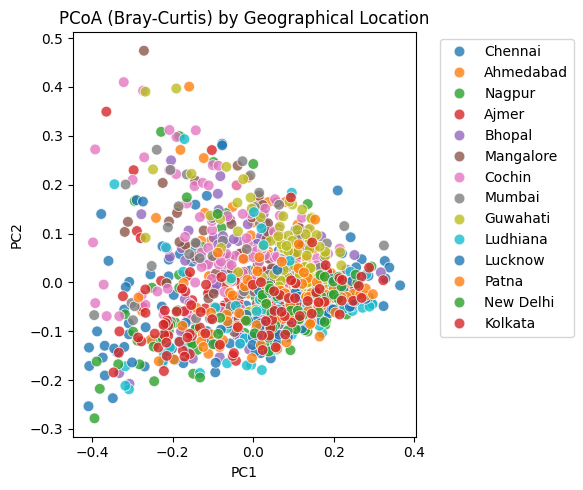

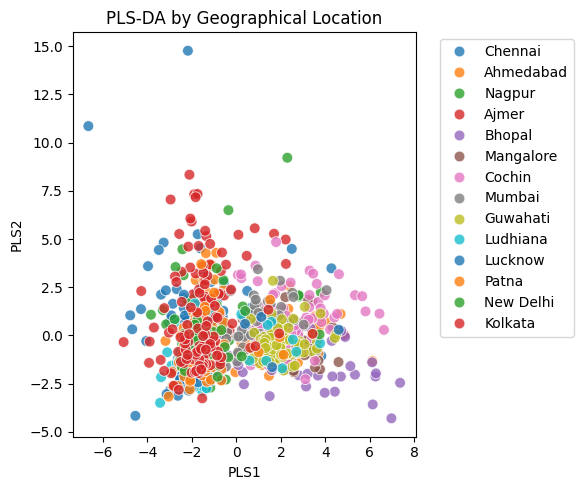

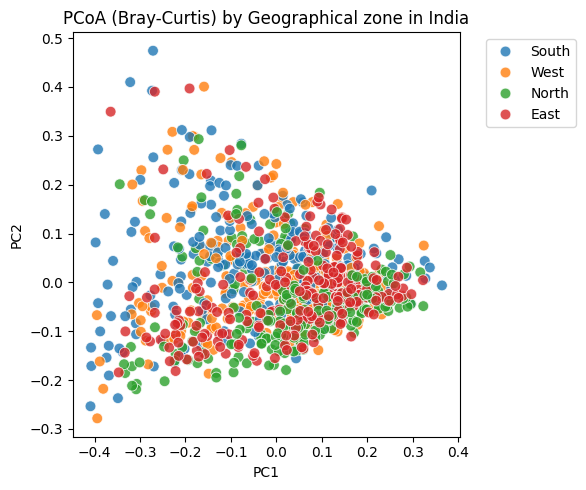

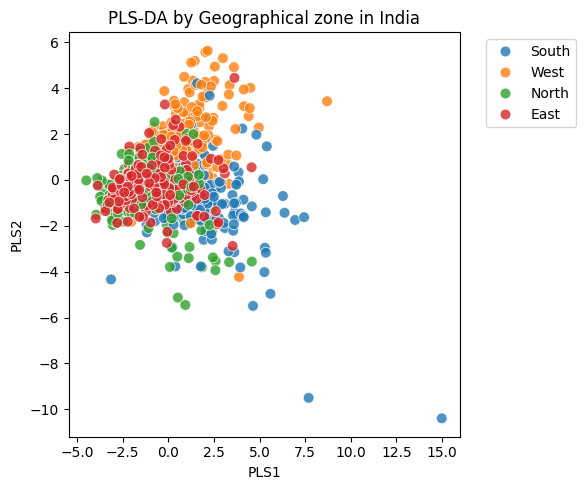

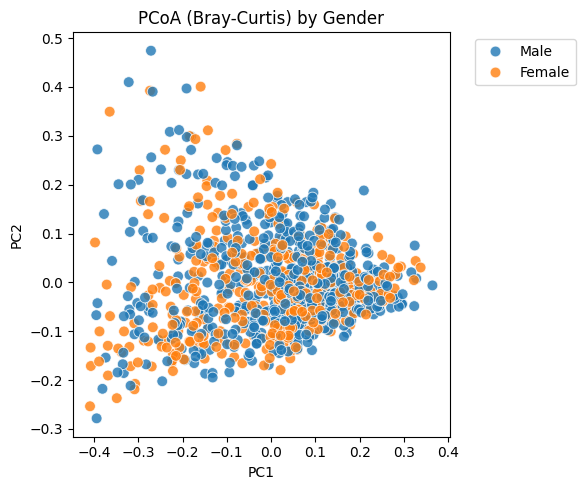

...

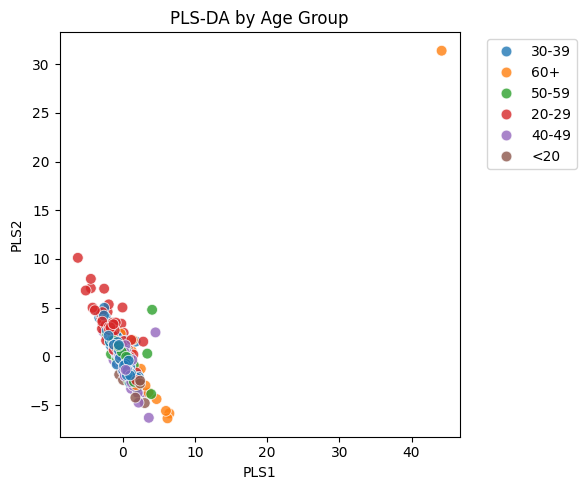

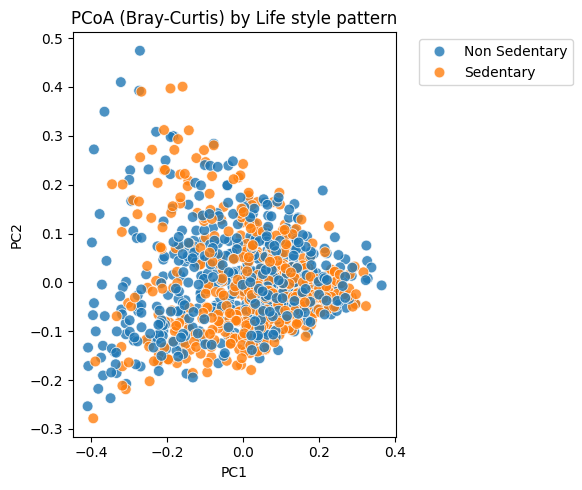

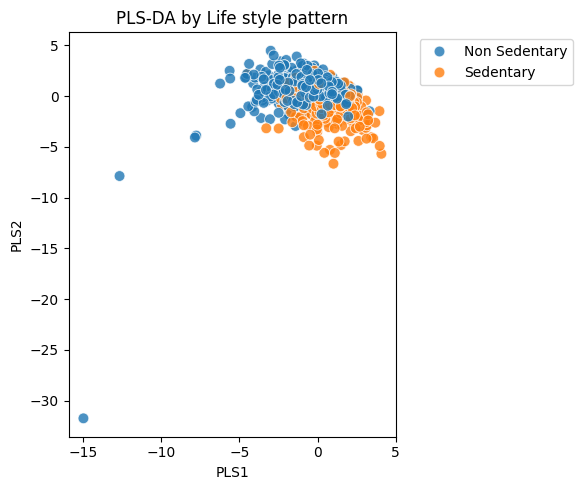

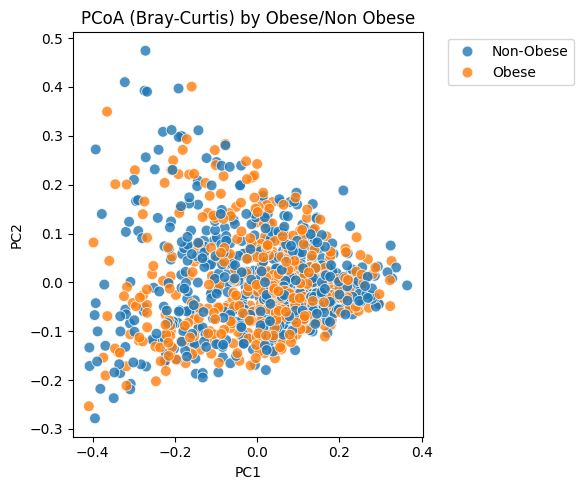

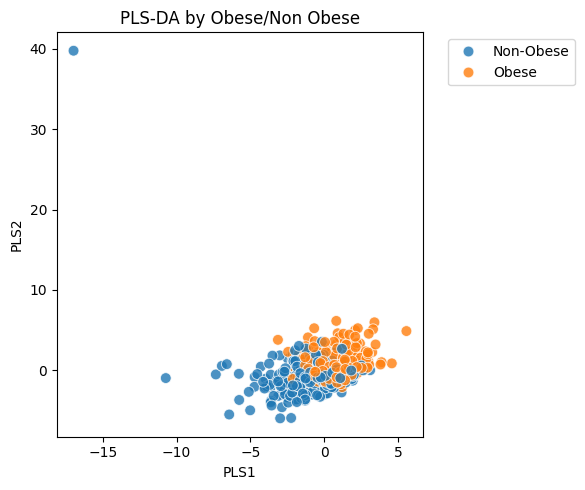

In [12]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from skbio.stats.ordination import pcoa
from skbio.diversity import beta_diversity
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import OneHotEncoder, StandardScaler

# =======================
# 1. Load data + metadata
# =======================
otu = pd.read_excel("/home/user/Documents/Sandhya/AI_in_medicine_lab/AI project/abundance_only.xlsx", index_col=0)
meta = pd.read_excel("/home/user/Documents/Sandhya/AI_in_medicine_lab/AI project/metadata_only.xlsx") 

# Ensure indices are strings
otu.index = otu.index.astype(str)
meta["Subject ID"] = meta["Subject ID"].astype(str)

# Align OTU and metadata
otu = otu.loc[otu.index.intersection(meta["Subject ID"])]
meta = meta.set_index("Subject ID").loc[otu.index]

print("OTU shape after alignment:", otu.shape)
print("Metadata shape after alignment:", meta.shape)

# ==========================
# 2. Optional prevalence filtering
# ==========================
def prevalence_filter(df, threshold=0.05):
    """
    Keep columns (taxa) present in at least 'threshold' fraction of samples.
    """
    min_samples = int(threshold * df.shape[0])
    return df.loc[:, (df > 0).sum(axis=0) >= min_samples]

otu = prevalence_filter(otu, threshold=0.05)

# ==========================
# 3. PCoA (Bray-Curtis)
# ==========================
bc_dm = beta_diversity("braycurtis", otu.values, ids=otu.index)
bc_pcoa = pcoa(bc_dm).samples.iloc[:, :2]  # first 2 axes
bc_pcoa = bc_pcoa.join(meta)

# ==========================
# 4. Plotting function (interactive)
# ==========================
def plot_scatter(df, x, y, hue, title):
    plt.figure(figsize=(6,5))
    sns.scatterplot(data=df, x=x, y=y, hue=hue, palette="tab10", s=60, alpha=0.8)
    plt.title(title)
    plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    plt.tight_layout()
    plt.show()

# ==========================
# 5. PLS-DA function
# ==========================
def run_plsda(otu, meta, column):
    """
    Perform PLS-DA using the first 2 components.
    """
    X = StandardScaler().fit_transform(otu.values)
    y = meta[column].astype(str).values.reshape(-1,1)
    
    enc = OneHotEncoder(sparse_output=False).fit(y)
    Y = enc.transform(y)

    pls = PLSRegression(n_components=2)
    pls.fit(X, Y)
    scores = pls.transform(X)

    scores_df = pd.DataFrame(scores, index=otu.index, columns=["PLS1","PLS2"])
    scores_df[column] = meta[column]
    return scores_df

# ==========================
# 6. Loop through metadata columns
# ==========================
# 6. Loop through metadata columns
# ==========================
# Ensure numeric ages
meta["Age in years"] = pd.to_numeric(meta["Age in years"], errors="coerce")

# Define age grouping safely
def bin_age(age):
    if pd.isna(age):
        return "Unknown"
    elif age < 20:
        return "<20"
    elif 20 <= age < 30:
        return "20-29"
    elif 30 <= age < 40:
        return "30-39"
    elif 40 <= age < 50:
        return "40-49"
    elif 50 <= age < 60:
        return "50-59"
    else:
        return "60+"



# Add new column for age groups
meta["Age Group"] = meta["Age in years"].apply(bin_age)
bc_pcoa = bc_pcoa.drop(columns=meta.columns, errors="ignore").join(meta)
metadata_columns = [
    "Geographical Location",
    "Geographical zone in India",
    "Gender",
    "Age Group",   # 👈 use grouped age instead of raw years
    "Life style pattern",
    "Obese/Non Obese"
]

for col in metadata_columns:
    # --- PCoA ---
    plot_scatter(
        bc_pcoa, "PC1", "PC2", col, 
        f"PCoA (Bray-Curtis) by {col}"
    )
    
    # --- PLS-DA ---
    pls_df = run_plsda(otu, meta, col)
    plot_scatter(
        pls_df, "PLS1", "PLS2", col, 
        f"PLS-DA by {col}"
    )



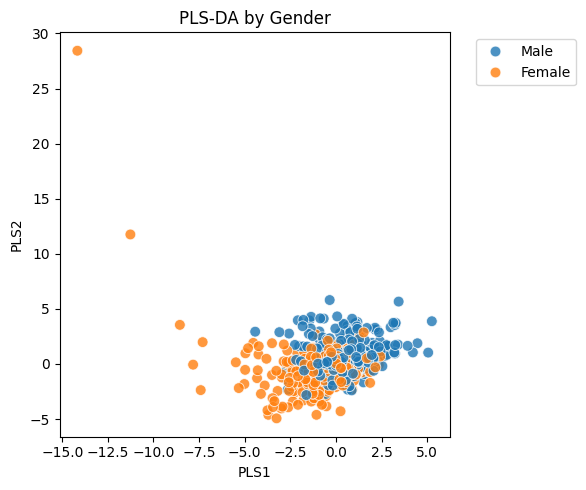

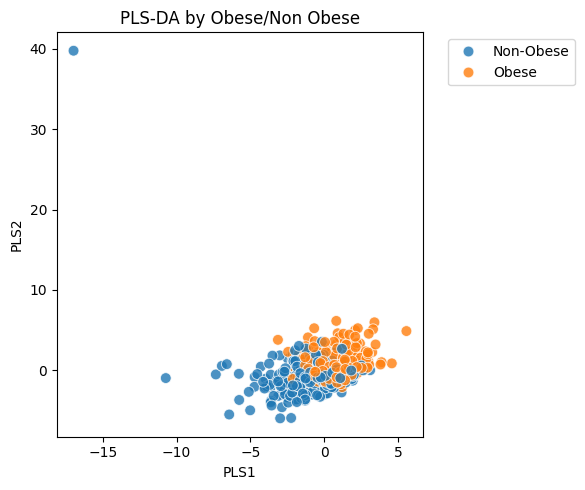

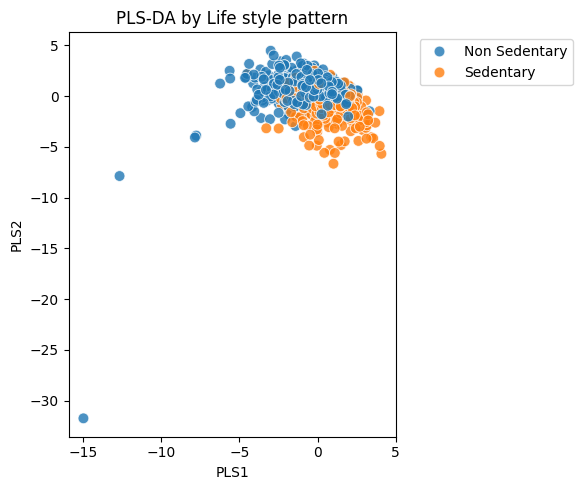

✅ Plots displayed for Gender, Obese/Non Obese, and Life style pattern.


In [7]:
# ==========================
# 6. Loop through selected metadata columns
# ==========================
metadata_columns = [
    "Gender",
    "Obese/Non Obese",
    "Life style pattern"
]

for col in metadata_columns:
    # --- PCoA ---

    # --- PLS-DA ---
    pls_df = run_plsda(otu, meta, col)
    plot_scatter(
        pls_df, "PLS1", "PLS2", col, 
        f"PLS-DA by {col}"
    )

print("✅ Plots displayed for Gender, Obese/Non Obese, and Life style pattern.")


In [9]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import make_pipeline

# Function to run classifier for one metadata column
def run_classifier(otu, meta, column):
    X = StandardScaler().fit_transform(otu.values)
    y = meta[column].astype(str).values
    
    clf = make_pipeline(
        StandardScaler(),
        RandomForestClassifier(n_estimators=200, random_state=42)
    )
    
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    scores = cross_val_score(clf, X, y, cv=cv, scoring="accuracy")
    
    print(f"{column}: Mean CV Accuracy = {scores.mean():.3f} ± {scores.std():.3f}")
    return scores

# Run only for the three features
features_to_test = ["Gender", "Obese/Non Obese", "Life style pattern", "Geographical zone in India"]

for col in features_to_test:
    run_classifier(otu, meta, col)


Gender: Mean CV Accuracy = 0.563 ± 0.019
Obese/Non Obese: Mean CV Accuracy = 0.550 ± 0.021
Life style pattern: Mean CV Accuracy = 0.633 ± 0.028
Geographical zone in India: Mean CV Accuracy = 0.669 ± 0.018


# Models with just Metadata

In [72]:
import pandas as pd
import numpy as np
from itertools import combinations
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, HistGradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
import xgboost as xgb
from tqdm import tqdm
import time

# =======================
# 1. Load metadata
# =======================
meta = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\metadata_only.xlsx")

target_col = "Obese/Non Obese"

# Drop samples with missing target
meta = meta.dropna(subset=[target_col])

# =======================
# 2. Define features & target
# =======================
drop_cols = ["BMI", "Subject ID"]  # remove unwanted columns
features = [col for col in meta.columns if col not in drop_cols + [target_col]]

X = meta[features]
y = meta[target_col].astype(str)

# Encode target labels (Obese / Non-Obese → 0/1)
le = LabelEncoder()
y_encoded = le.fit_transform(y)

# =======================
# 3. Encode categorical + numeric features
# =======================
X_encoded = X.copy()

# Encode categorical features with LabelEncoder (1 col per categorical variable)
for col in X.select_dtypes(include="object").columns:
    le = LabelEncoder()
    X_encoded[col] = le.fit_transform(X[col].astype(str))

# Scale numeric features (optional, but helps SVM/LogReg)
num_cols = X_encoded.select_dtypes(include=np.number).columns.tolist()
scaler = StandardScaler()
X_encoded[num_cols] = scaler.fit_transform(X_encoded[num_cols])

# =======================
# 4. Define models
# =======================
models = {
    "RandomForest": RandomForestClassifier(n_estimators=200, random_state=42),
    "HistGradientBoost": HistGradientBoostingClassifier(max_iter=200, random_state=42),
    "XGBoost": xgb.XGBClassifier(use_label_encoder=False, eval_metric="logloss", random_state=42),
    "SVM": SVC(kernel="rbf", probability=True, random_state=42),
    "LogisticRegression": LogisticRegression(max_iter=500, random_state=42)
}

# =======================
# 5. Evaluation function
# =======================
def evaluate_features(X_subset, y, model, cv=5):
    skf = StratifiedKFold(n_splits=cv, shuffle=True, random_state=42)
    scores = cross_val_score(model, X_subset, y, cv=skf, scoring="accuracy", n_jobs=-1)
    return np.mean(scores)

# =======================
# 6. Evaluate single features & pairs (with progress bar + sleep)
# =======================
results = []

all_features = X_encoded.columns.tolist()
feature_pairs = list(combinations(all_features, 2))

# Single features
for feat in tqdm(all_features, desc="Single features"):
    for model_name, model in models.items():
        acc = evaluate_features(X_encoded[[feat]], y_encoded, model)
        results.append({"Features": feat, "Model": model_name, "Accuracy": acc})
    time.sleep(0.2)  # pause to reduce system load

# Feature pairs
for feat_pair in tqdm(feature_pairs, desc="Feature pairs"):
    for model_name, model in models.items():
        acc = evaluate_features(X_encoded[list(feat_pair)], y_encoded, model)
        results.append({"Features": "+".join(feat_pair), "Model": model_name, "Accuracy": acc})
    time.sleep(0.2)

# =======================
# 7. Summarize results
# =======================
results_df = pd.DataFrame(results)
results_df = results_df.sort_values("Accuracy", ascending=False).reset_index(drop=True)

print(results_df.head(20))

# Save to Excel
results_df.to_excel(
    r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\feature_pair_results.xlsx",
    index=False
)


Feature pairs: 100%|██████████| 10/10 [00:26<00:00,  2.62s/it]

                                            Features               Model  \
0           Geographical Location+Life style pattern             XGBoost   
1           Geographical Location+Life style pattern   HistGradientBoost   
2           Geographical Location+Life style pattern        RandomForest   
3   Geographical Location+Geographical zone in India   HistGradientBoost   
4                              Geographical Location        RandomForest   
5   Geographical Location+Geographical zone in India        RandomForest   
6   Geographical Location+Geographical zone in India             XGBoost   
7                              Geographical Location   HistGradientBoost   
8                              Geographical Location             XGBoost   
9           Geographical Location+Life style pattern                 SVM   
10                Geographical Location+Age in years        RandomForest   
11                      Geographical Location+Gender        RandomForest   
12          

In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import StratifiedKFold, cross_val_score, RandomizedSearchCV
from sklearn.ensemble import (RandomForestClassifier, GradientBoostingClassifier, 
                              ExtraTreesClassifier, AdaBoostClassifier, VotingClassifier,
                              BaggingClassifier, StackingClassifier)
from sklearn.linear_model import LogisticRegression, RidgeClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, roc_auc_score, f1_score
import xgboost as xgb
import lightgbm as lgb
from scipy.stats import uniform, randint
from tqdm import tqdm
import warnings

warnings.filterwarnings('ignore')

def centered_log_ratio(data):
    """
    Performs the Centered Log-Ratio (CLR) transformation.
    A small pseudocount is added to handle zero values.
    """
    data_pseudo = data + 1e-6
    geometric_mean = np.exp(np.log(data_pseudo).mean(axis=1))
    clr_transformed = np.log(data_pseudo.divide(geometric_mean, axis=0))
    return clr_transformed

def isometric_log_ratio(data):
    """
    Performs a simplified Isometric Log-Ratio (ILR) transformation.
    """
    data_pseudo = data + 1e-6
    n_features = data_pseudo.shape[1]
    ilr_features = pd.DataFrame(index=data_pseudo.index)
    for i in range(1, n_features):
        part1 = data_pseudo.iloc[:, :i]
        part2 = data_pseudo.iloc[:, i]
        gm1 = np.exp(np.log(part1).mean(axis=1))
        gm2 = part2
        balance = np.sqrt(i / (i + 1)) * np.log(gm1 / gm2)
        ilr_features[f'ilr_balance_{i}'] = balance
    return ilr_features

def run_tuned_pipeline_optimized():
    """
    Runs the tuned classification pipeline for a specific set of combinations.
    """
    
    # ------------------
    # 1. Load Data
    # ------------------
    print("📂 Loading data...")
    try:
        otu_raw = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\abundance_only.xlsx", index_col=0)
        meta_raw = pd.read_excel(r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\metadata_only.xlsx")
    except FileNotFoundError:
        print("Error: Make sure your data files are in the specified path.")
        return

    meta = meta_raw.set_index(meta_raw.columns[0])
    
    # Define models and their hyperparameter search spaces
    models_and_params = {
        'XGBoost': (xgb.XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42), {
            'n_estimators': randint(50, 300), 'learning_rate': uniform(0.01, 0.3),
            'max_depth': randint(3, 10), 'subsample': uniform(0.6, 0.4),
            'colsample_bytree': uniform(0.6, 0.4)
        }),
        'HistGradientBoost': (lgb.LGBMClassifier(random_state=42), {
            'n_estimators': randint(50, 300), 'learning_rate': uniform(0.01, 0.3),
            'max_depth': randint(3, 10), 'num_leaves': randint(10, 50)
        }),
        'RandomForest': (RandomForestClassifier(random_state=42, n_jobs=-1), {
            'n_estimators': randint(100, 500), 'max_depth': randint(5, 20),
            'min_samples_leaf': randint(1, 10), 'max_features': ['sqrt', 'log2', None]
        })
    }
    
    # Define filtering and transformation strategies
    filter_functions = {
        'No_Filtering': lambda df: df,
        'Abundance_0.1%': lambda df: df.loc[:, (df > 0.001).any(axis=0)],
        'Prevalence_5%': lambda df: df.loc[:, (df > 0).mean(axis=0) >= 0.05],
        'Both_Filters': lambda df: df.loc[:, ((df > 0.001).any(axis=0) & ((df > 0).mean(axis=0) >= 0.05))],
    }
    
    # Define the specific combinations you want to run
    combinations_to_run = [
        ('Prevalence_5%', 'RandomForest'),
        ('Prevalence_5%', 'HistGradientBoost'),
        ('Abundance_0.1%', 'XGBoost'),
        ('Both_Filters', 'HistGradientBoost'),
        ('Abundance_0.1%', 'HistGradientBoost'),
        ('No_Filtering', 'XGBoost'),
        ('Both_Filters', 'RandomForest'),
        ('No_Filtering', 'HistGradientBoost'),
        ('Both_Filters', 'XGBoost'),
        ('Prevalence_5%', 'XGBoost'),
        ('Abundance_0.1%', 'RandomForest'),
        ('No_Filtering', 'RandomForest')
    ]

    target_col = 'Geographical zone in India'
    results = []

    print(f"\n🚀 Running tuned pipeline for target: {target_col}")
    
    y = meta[target_col]
    y = y.dropna()
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    
    common_samples = list(set(otu_raw.index) & set(y.index))
    otu_aligned = otu_raw.loc[common_samples]
    y_series = pd.Series(y_encoded, index=y.index)
    y_final = y_series.loc[common_samples]

    if otu_aligned.shape[0] < 20 or y_final.nunique() <= 1:
        print(f"   ⚠️ Not enough samples or classes for target: {target_col}. Skipping.")
        return
        
    print(f"   📊 Dataset size: {otu_aligned.shape[0]} samples, {otu_aligned.shape[1]} features")

    # ------------------
    # 2. Run selected combinations
    # ------------------
    for filter_name, model_name in tqdm(combinations_to_run, desc="Running Selected Combinations"):
        print(f"\n   ⚙️ Applying strategy: {filter_name} with Classifier: {model_name}")

        try:
            filter_func = filter_functions[filter_name]
            otu_filtered = filter_func(otu_aligned.copy())

            if otu_filtered.shape[1] == 0:
                print(f"      ⚠️ No features remaining. Skipping.")
                continue

            X = otu_filtered
            
            model, param_dist = models_and_params[model_name]
            
            cv_inner = StratifiedKFold(n_splits=3, shuffle=True, random_state=42)
            cv_outer = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

            X_model = X
            if model_name in ['SVM', 'LogisticRegression']:
                scaler = StandardScaler()
                X_model = scaler.fit_transform(X)
            
            random_search = RandomizedSearchCV(
                estimator=model,
                param_distributions=param_dist,
                n_iter=20,
                cv=cv_inner,
                scoring='accuracy',
                n_jobs=-1,
                verbose=0,
                random_state=42
            )
            
            random_search.fit(X_model, y_final)
            best_model = random_search.best_estimator_

            cv_scores = cross_val_score(best_model, X_model, y_final, cv=cv_outer, scoring='accuracy', n_jobs=-1)
            
            is_binary = y_final.nunique() == 2
            cv_roc_auc = [np.nan] * 5
            cv_f1 = [np.nan] * 5
            
            if is_binary:
                if hasattr(best_model, 'predict_proba'):
                    cv_roc_auc = cross_val_score(best_model, X_model, y_final, cv=cv_outer, scoring='roc_auc', n_jobs=-1)
                cv_f1 = cross_val_score(best_model, X_model, y_final, cv=cv_outer, scoring='f1', n_jobs=-1)

            results.append({
                'Target_Feature': 'Geographical zone in India',
                'Filtering_Strategy': filter_name,
                'Classifier': model_name,
                'CV_Accuracy_Mean': np.mean(cv_scores),
                'CV_Accuracy_Std': np.std(cv_scores),
                'CV_F1_Mean': np.mean(cv_f1),
                'CV_AUC_Mean': np.mean(cv_roc_auc),
                'Features_Count': X.shape[1],
                'Samples_Count': X.shape[0],
                'Best_Hyperparameters': str(random_search.best_params_)
            })

        except Exception as e:
            print(f"      ❌ Error with {model_name} on {filter_name}: {str(e)}")
            results.append({
                'Target_Feature': 'Geographical zone in India',
                'Filtering_Strategy': filter_name,
                'Classifier': model_name,
                'CV_Accuracy_Mean': np.nan,
                'CV_Accuracy_Std': np.nan,
                'CV_F1_Mean': np.nan,
                'CV_AUC_Mean': np.nan,
                'Features_Count': X.shape[1],
                'Samples_Count': X.shape[0],
                'Best_Hyperparameters': 'Error'
            })
    
    # ------------------
    # 3. Save Results to Excel
    # ------------------
    results_df = pd.DataFrame(results)
    output_file = r"C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\geographical_zone_tuned_results_optimized.xlsx"
    
    try:
        results_df.to_excel(output_file, index=False)
        print(f"\n✅ All results saved to: {output_file}")
    except Exception as e:
        print(f"\n❌ Could not save to Excel file. Error: {str(e)}")
        print("\nDisplaying results in console instead:")
        print(results_df)

if __name__ == '__main__':
    run_tuned_pipeline_optimized()

📂 Loading data...

🚀 Running tuned pipeline for target: Geographical zone in India
   📊 Dataset size: 1004 samples, 993 features


Running Selected Combinations:   0%|          | 0/12 [00:00<?, ?it/s]


   ⚙️ Applying strategy: Prevalence_5% with Classifier: RandomForest


Running Selected Combinations:   8%|▊         | 1/12 [05:39<1:02:15, 339.58s/it]


   ⚙️ Applying strategy: Prevalence_5% with Classifier: HistGradientBoost
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012020 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27366
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 224
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.418686
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.347227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive ga

Running Selected Combinations:  17%|█▋        | 2/12 [12:55<1:06:05, 396.53s/it]


   ⚙️ Applying strategy: Abundance_0.1% with Classifier: XGBoost


Running Selected Combinations:  25%|██▌       | 3/12 [23:32<1:15:55, 506.12s/it]


   ⚙️ Applying strategy: Both_Filters with Classifier: HistGradientBoost
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.034893 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 27315
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 222
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.418686
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.347227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

Running Selected Combinations:  33%|███▎      | 4/12 [36:42<1:22:26, 618.26s/it]


   ⚙️ Applying strategy: Abundance_0.1% with Classifier: HistGradientBoost
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 28169
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 290
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.418686
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.347227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits

Running Selected Combinations:  42%|████▏     | 5/12 [41:08<57:17, 491.07s/it]  


   ⚙️ Applying strategy: No_Filtering with Classifier: XGBoost


Running Selected Combinations:  50%|█████     | 6/12 [48:24<47:14, 472.44s/it]


   ⚙️ Applying strategy: Both_Filters with Classifier: RandomForest


Running Selected Combinations:  58%|█████▊    | 7/12 [52:37<33:24, 400.81s/it]


   ⚙️ Applying strategy: No_Filtering with Classifier: HistGradientBoost
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.018033 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 28477
[LightGBM] [Info] Number of data points in the train set: 1004, number of used features: 315
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.418686
[LightGBM] [Info] Start training from score -1.390286
[LightGBM] [Info] Start training from score -1.347227
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits w

Running Selected Combinations:  67%|██████▋   | 8/12 [1:19:30<52:26, 786.52s/it]


   ⚙️ Applying strategy: Both_Filters with Classifier: XGBoost


Running Selected Combinations:  75%|███████▌  | 9/12 [1:26:12<33:19, 666.40s/it]


   ⚙️ Applying strategy: Prevalence_5% with Classifier: XGBoost


Running Selected Combinations:  83%|████████▎ | 10/12 [1:32:18<19:07, 573.61s/it]


   ⚙️ Applying strategy: Abundance_0.1% with Classifier: RandomForest


Running Selected Combinations:  92%|█████████▏| 11/12 [1:35:49<07:42, 462.59s/it]


   ⚙️ Applying strategy: No_Filtering with Classifier: RandomForest


Running Selected Combinations: 100%|██████████| 12/12 [1:39:58<00:00, 499.87s/it]



✅ All results saved to: C:\Users\91735\OneDrive\IITM\PhD\Coursework Sem 3\AI project\geographical_zone_tuned_results_optimized.xlsx


In [16]:
pip install adjustText

Note: you may need to restart the kernel to use updated packages.


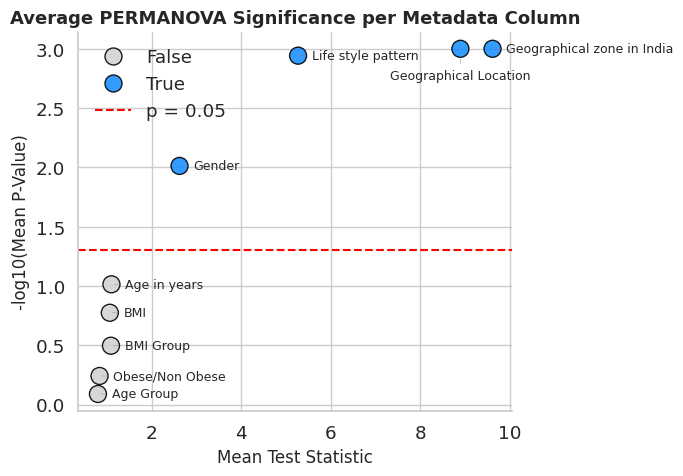

In [26]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

# Load data
df = pd.read_excel("/home/user/Documents/Sandhya/AI_in_medicine_lab/AI project/PERMANOVA_Results_20250907_103456.xlsx")

# Average across metadata columns
df_grouped = (
    df.groupby('Metadata_Column', as_index=False)[['Test_Statistic', 'P_Value']].mean()
)

# Flag significance
df_grouped['Significant'] = df_grouped['P_Value'] < 0.05

# Plot setup
plt.figure(figsize=(7, 5))
sns.set(style="whitegrid", font_scale=1.2)

# Scatter plot
sns.scatterplot(
    data=df_grouped,
    x='Test_Statistic',
    y=-np.log10(df_grouped['P_Value']),
    hue='Significant',
    palette={True: 'dodgerblue', False: 'lightgray'},
    s=150,
    edgecolor='black',
    alpha=0.9,
    zorder=3
)

# Red significance line
plt.axhline(-np.log10(0.05), color='red', linestyle='--', label='p = 0.05', zorder=1)

# Labels - right for all, below for Geographical Location
for i, row in df_grouped.iterrows():
    x = row['Test_Statistic']
    y = -np.log10(row['P_Value'])
    
    # Special case for Geographical Location
    if row['Metadata_Column'] == 'Geographical Location':
        plt.annotate(
            row['Metadata_Column'],
            xy=(x, y),
            xytext=(0, -15),  # Below the point
            textcoords='offset points',
            fontsize=9,
            weight='medium',
            ha='center',
            va='top',
            arrowprops=dict(arrowstyle='-', color='gray', lw=0.5, alpha=0.6)
        )
    else:
        # All other labels to the right
        plt.annotate(
            row['Metadata_Column'],
            xy=(x, y),
            xytext=(10, 0),
            textcoords='offset points',
            fontsize=9,
            weight='medium',
            ha='left',
            va='center',
            arrowprops=dict(arrowstyle='-', color='gray', lw=0.5, alpha=0.6)
        )

# Axis labels and title
plt.xlabel('Mean Test Statistic', fontsize=12)
plt.ylabel('-log10(Mean P-Value)', fontsize=12)
plt.title('Average PERMANOVA Significance per Metadata Column', fontsize=13, weight='bold')

# Legend on left
plt.legend(frameon=False, loc='upper left', bbox_to_anchor=(0, 1))

# Clean layout
sns.despine()
plt.tight_layout()
plt.show()